In [1]:
%load_ext autoreload
%autoreload 2

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import utils
from forecasting import SalesForecaster
from sktime.transformations.series.boxcox import BoxCoxTransformer
from statsmodels.graphics import tsaplots
from statsmodels.tsa.stattools import acf, pacf

In [3]:
%cd ..
%ls ./data

/home/den/dev/git/time-series-analysis/final-task
shop_sales.csv  shop_sales_dates.csv  shop_sales_prices.csv


In [ ]:
MAIN_CLASS = SalesForecaster()

# EDA

## Общий

In [ ]:
sales = pd.read_csv("./data/shop_sales.csv")
dates = pd.read_csv("./data/shop_sales_dates.csv")
prices = pd.read_csv("./data/shop_sales_prices.csv")

In [ ]:
utils.pretty_info(sales, "sales")
utils.pretty_info(dates, "dates")
utils.pretty_info(prices, "prices")

sales:
  Columns: ['item_id', 'store_id', 'date_id', 'cnt']
  Rows: 81855
--------------------------------------------------
dates:
  Columns: ['date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'date_id', 'CASHBACK_STORE_1', 'CASHBACK_STORE_2', 'CASHBACK_STORE_3']
  Rows: 1819
--------------------------------------------------
prices:
  Columns: ['store_id', 'item_id', 'wm_yr_wk', 'sell_price']
  Rows: 11141
--------------------------------------------------


Далее буду работать с магазином `store_id = STORE_1`.

In [ ]:
sales, dates, prices = MAIN_CLASS._select_data_for_store(sales, dates, prices, 1)

In [ ]:
utils.pretty_info(sales, "sales")
utils.pretty_info(dates, "dates")
utils.pretty_info(prices, "prices")

sales:
  Columns: ['item_id', 'date_id', 'cnt']
  Rows: 27285
--------------------------------------------------
dates:
  Columns: ['date', 'wm_yr_wk', 'weekday', 'wday', 'month', 'year', 'event_name_1', 'event_type_1', 'event_name_2', 'event_type_2', 'date_id', 'cashback']
  Rows: 1819
--------------------------------------------------
prices:
  Columns: ['item_id', 'wm_yr_wk', 'sell_price']
  Rows: 3873
--------------------------------------------------


### Анализ sales

In [ ]:
sales.head()

,item_id,date_id,cnt
54570,064,1,0
54571,064,2,1
54572,064,3,0
54573,064,4,0
54574,064,5,0


In [ ]:
unique_items = sales["item_id"].unique()
n_items = len(unique_items)
print(f"Number of unique items: {n_items}")

Number of unique items: 15


In [ ]:
# Проверим, что для каждого товара один и тот же временной диапазон
for item in unique_items:
    item_sales = sales[sales["item_id"] == item]
    first_date = item_sales["date_id"].min()
    last_date = item_sales["date_id"].max()
    print(f"Item {item}: first date_id = {first_date}, last date_id = {last_date}")

Item 064: first date_id = 1, last date_id = 1819
Item 065: first date_id = 1, last date_id = 1819
Item 325: first date_id = 1, last date_id = 1819
Item 376: first date_id = 1, last date_id = 1819
Item 090: first date_id = 1, last date_id = 1819
Item 252: first date_id = 1, last date_id = 1819
Item 339: first date_id = 1, last date_id = 1819
Item 546: first date_id = 1, last date_id = 1819
Item 547: first date_id = 1, last date_id = 1819
Item 555: first date_id = 1, last date_id = 1819
Item 584: first date_id = 1, last date_id = 1819
Item 586: first date_id = 1, last date_id = 1819
Item 587: first date_id = 1, last date_id = 1819
Item 714: first date_id = 1, last date_id = 1819
Item 727: first date_id = 1, last date_id = 1819


У нас по-дневные данные продаж в `sales`.  
Для всех товаров временной диапазон продаж одинаков - это хорошо. 

In [ ]:
n_days = sales["date_id"].max() - sales["date_id"].min() + 1
print(f"Number of days in sales data: {n_days}")
n_weeks = n_days / 7
n_months = n_days / 30
n_quarters = n_days / (4 * 30)
n_years = n_days / 365
print(f"Number of weeks in sales data: {n_weeks}")
print(f"Number of months in sales data: {n_months}")
print(f"Number of quarters in sales data: {n_quarters}")
print(f"Number of years in sales data: {n_years}")

Number of days in sales data: 1819
Number of weeks in sales data: 259.85714285714283
Number of months in sales data: 60.63333333333333
Number of quarters in sales data: 15.158333333333333
Number of years in sales data: 4.983561643835617


Временной диапазон длительный (почти 5 лет). Поэтому по идее мы даже сможем захватить годовую сезонность (так как для "захвата" сезонности требуется, чтобы было хотя бы 2 периода в train сплите).

План по сплиту данных:
- test: в зависимости от горизонта прогнозирования берем 7, 30, 120 последних дней. Это будет отложенный тестовый ВР, на котором будем финально сравнивать модели.
- train + val: берем (2 + 1) года сразу перед test срезом (не пересекаясь). Валидация в 1 год нам нужна для того чтобы валидировать предсказания модели в разные промежутки года.

Я буду обучать 3 разные модели для разных горизонтов прогнозирования: 7, 30 и 120 дней. Для каждого горизонта будет свой шаг скользящего окна, чтобы получилось по 5 train-val сплитов (5 сплитов - чтобы считалось за разумное время).

In [ ]:
# Отсечем сразу данные, которые не попадут ни в один сплит (слишком старые)
TRAIN_VAL_SIZE = (2 + 1) * 365
TEST_SIZE = max(7, 30, 120)

sales = sales[sales["date_id"] >= sales["date_id"].max() - TRAIN_VAL_SIZE - TEST_SIZE]

sales.date_id.min(), sales.date_id.max()

(604, 1819)

In [ ]:
# Рассчитаем шаги для сплитов разных горизонтов прогнозирования

splits = 5

for fh in (7, 30, 120):
    print(f"Forecast horizon: {fh} days")
    step = (365 - fh) // (splits - 1)
    print(f"Step size: {step} days")
    print()

Forecast horizon: 7 days
Step size: 89 days

Forecast horizon: 30 days
Step size: 83 days

Forecast horizon: 120 days
Step size: 61 days



Таким образом, для каждого горизонта прогнозирования будет проведено по 5 train-val сплитов для оценки моделей.

Валидировать модели буду на соответствующем горизонте (7, 30 или 120 дней), чтобы параметры подбирались под нужный сценарий использования.

Изобразим графики продаж.

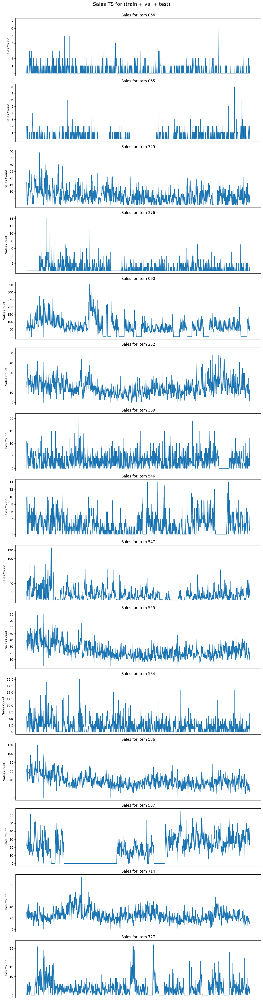

In [ ]:
fig, axes = plt.subplots(n_items, 1, figsize=(12, 3 * n_items), sharex=True)

for ax, item in zip(axes, unique_items):
    item_sales = sales[sales["item_id"] == item].sort_values("date_id").cnt.reset_index(drop=True)
    ax.plot(item_sales)

    ax.set_title(f"Sales for item {item}")
    ax.set_ylabel("Sales Count")
    ax.set_xticks([])

fig.suptitle("Sales TS for (train + val + test)", fontsize=16, y=1)
plt.tight_layout()
plt.show()

Построим графики продаж на последний квартал.

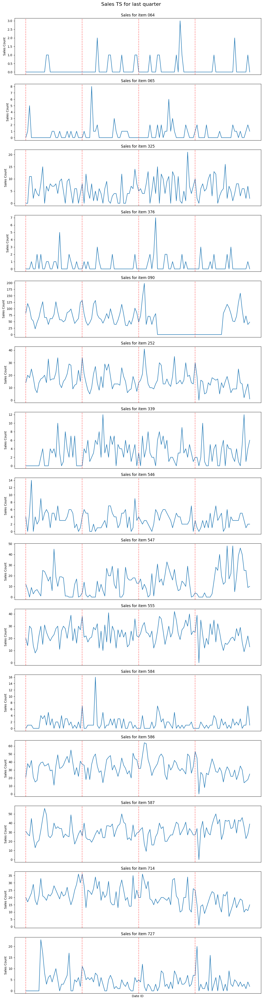

In [ ]:
fig, axes = plt.subplots(n_items, 1, figsize=(12, 3 * n_items), sharex=True)

for ax, item in zip(axes, unique_items):
    item_sales = sales[sales["item_id"] == item][-120:]  # Last quarter
    ax.plot(item_sales["date_id"], item_sales["cnt"])

    # Draw vertical lines at each 30 date_id
    min_date = item_sales["date_id"].min()
    max_date = item_sales["date_id"].max()
    for d in range(min_date, max_date + 1, 30):
        ax.axvline(x=d, color="red", linestyle="--", alpha=0.5)

    ax.set_title(f"Sales for item {item}")
    ax.set_ylabel("Sales Count")
    ax.set_xticks([])

fig.suptitle("Sales TS for last quarter", fontsize=16, y=1)
axes[-1].set_xlabel("Date ID")
plt.tight_layout()
plt.show()

Наблюдения:

- Значения наших ВР целые неотрицательные, а мы будем использовать модели, которые предсказывают непрерывные значения (в т.ч. отрицательные). Поэтому при финальных предсказаниях хорошо бы делать бинаризацию значений, а также преобразование отрицательных в 0.
- У некоторых ВР отсутствует выраженный долгосрочный тренд продаж (064), а у некоторых присутствует (252).
- Дневные продажи довольно сильно колебаются. 
- Можно заметить некоторую около-недельную сезонность (то есть цикл) у многих ВР.
- Во многих ВР есть отрезки с нулевыми продажами. Для этого может быть 2 причины:

    - Товар действительно покупают не каждый день. Например, товары 064, 065.
    - Товар в магазине закончился по какой-либо причине (проблемы с доставкой, не выставили на полки).
    
- Видны "всплески" продаж (как однодневные, так и довольно продолжительные (2-3 недели)), однако называть это аномалиями не хочется, так как предполагаю, что это может быть причиной праздников (данные по которым у нас есть).
- Среди 15 товаров есть как популярные (090 - покупают в среднем по 150 раз в день), так и довольно редкие (064 - 1 продажа в день).

Посчитаем статистики по каждому ВР.

In [ ]:
stats = []

for item_id, group in sales.groupby("item_id"):
    cnt = group["cnt"].values

    mean = np.mean(cnt)
    median = np.median(cnt)
    std = np.std(cnt)

    zero_mask = cnt == 0
    total_zeros = zero_mask.sum()
    percent_zeros = total_zeros / len(cnt) * 100

    # Find lengths of consecutive zero periods
    zero_periods = []
    count = 0
    for val in zero_mask:
        if val:
            count += 1
        elif count > 0:
            zero_periods.append(count)
            count = 0
    if count > 0:
        zero_periods.append(count)

    max_zero_period = max(zero_periods) if zero_periods else 0
    median_zero_period = np.median(zero_periods) if zero_periods else 0

    stats.append(
        {
            "item_id": item_id,
            "mean": mean,
            "median": median,
            "std": std,
            "total_zeros": total_zeros,
            "percent_zeros": percent_zeros,
            "max_zero_period": max_zero_period,
            "median_zero_period": median_zero_period,
        }
    )

stats_df = pd.DataFrame(stats).set_index("item_id").round(2).sort_values("median", ascending=False)
display(stats_df)

,mean,median,std,total_zeros,percent_zeros,max_zero_period,median_zero_period
item_id,,,,,,,
090,66.98,60.0,54.02,230,18.91,35,19.0
586,37.59,36.0,13.77,4,0.33,1,1.0
714,24.91,23.0,10.50,5,0.41,2,1.0
555,23.74,22.0,11.13,4,0.33,1,1.0
587,17.09,17.0,14.74,385,31.66,287,1.0
252,15.12,14.0,7.72,5,0.41,1,1.0
547,13.54,9.0,15.07,251,20.64,22,1.0
325,6.74,6.0,5.27,131,10.77,17,1.0
339,3.24,3.0,3.04,259,21.30,57,1.0


Разобьём все товары на 2 кластера:

- Часто продаваемые товары: у которых медиана продаж $> 10$ ед.
- Редко продаваемые товары: остальные.

In [ ]:
low_sell_items = stats_df[stats_df["median"] < 10].index.tolist()
high_sell_items = stats_df[stats_df["median"] >= 10].index.tolist()

print("Low selling items:", low_sell_items, "Length:", len(low_sell_items))
print("High selling items:", high_sell_items, "Length:", len(high_sell_items))

Low selling items: ['547', '325', '339', '727', '546', '584', '064', '065', '376'] Length: 9
High selling items: ['090', '586', '714', '555', '587', '252'] Length: 6


#### Препроцессинг

Можно выделить 2 основные проблемы в наших ВР, которые хочется убрать с помощью препроцессинга:

- "Дёрганные" графики продаж. У нас недостаточно данных (фичей) для того, чтобы уследить за всеми флуктуациями в этих **реальных** ВР. Поэтому буду применять сглаживание ряда. Таким образом модели будет легче "уловить" полезные паттерны, а не случайные (ненаблюдаемые нами) колебания.
- Нулевые значения во ВР. Нулевые значения могут быть истинными (товар не покупали в этот день, но он был доступен) и искусственные (товар не был доступен для продажи в этот день по какой-то причине). Так как для каждого нулевого значения наверняка причину мы определить не можем, то буду определять тип нулевого значения исходя из принадлежности товара к группе `["low selling items", "high selling items"]`, которые были определены выше. Соответственно препроцессинг будет следующий:

    - Истинные нулевые значения (товары группы "low selling items") - ничего не делаем. Иначе при любом типе интерполяции мы можем довольно сильно изменить ВР, так как числа дневных продаж так итак маленькие.
    - Искусственные нулевые значения (товары группы "high selling items") - интерполируем нулевые значения с помощью недельного скользящего среднего (это позволит как уменьшить шум, так и немного "захватить" недельную сезонность).

##### Сглаживание

Применим простое экспоненциальное сглаживание.

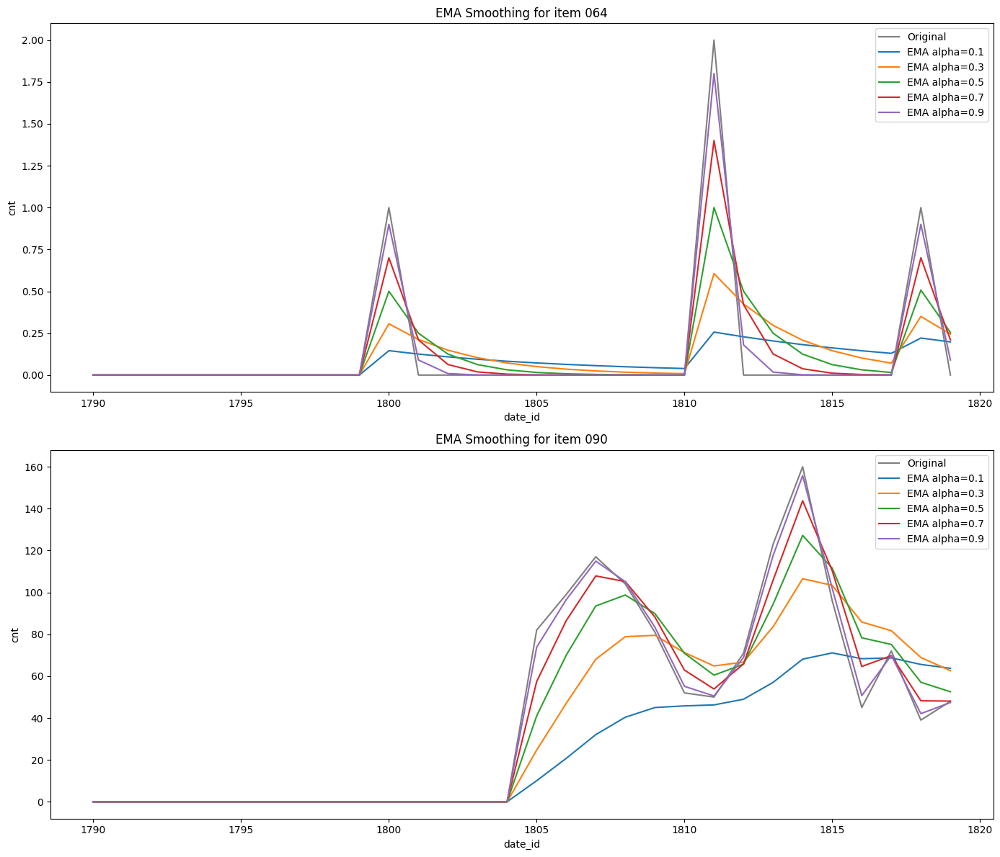

In [ ]:
plt.figure(figsize=(14, 12))

# Plot for item 064 (low selling)
plt.subplot(2, 1, 1)
item_id = "064"
item_sales = sales[sales["item_id"] == item_id].iloc[-30:].copy()
plt.plot(item_sales["date_id"], item_sales["cnt"], label="Original", color="black", alpha=0.5)
for alpha in (0.1, 0.3, 0.5, 0.7, 0.9):
    smoothed = MAIN_CLASS._apply_ema(item_sales["cnt"], alpha)
    plt.plot(item_sales["date_id"], smoothed, label=f"EMA alpha={alpha}")
plt.title(f"EMA Smoothing for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("cnt")
plt.legend()

# Plot for item 090 (high selling)
plt.subplot(2, 1, 2)
item_id = "090"
item_sales = sales[sales["item_id"] == item_id].iloc[-30:].copy()
plt.plot(item_sales["date_id"], item_sales["cnt"], label="Original", color="black", alpha=0.5)
for alpha in (0.1, 0.3, 0.5, 0.7, 0.9):
    smoothed = MAIN_CLASS._apply_ema(item_sales["cnt"], alpha)
    plt.plot(item_sales["date_id"], smoothed, label=f"EMA alpha={alpha}")
plt.title(f"EMA Smoothing for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("cnt")
plt.legend()

plt.tight_layout()
plt.show()

Будет оптимальным взять `alpha = 0.5`.

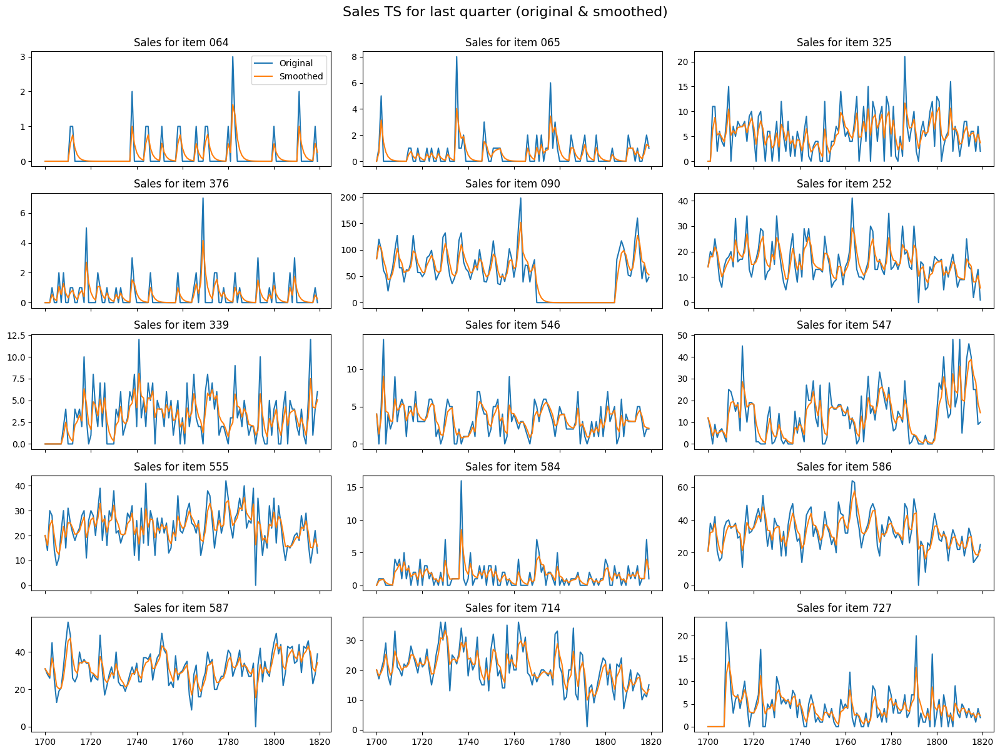

In [ ]:
alpha = 0.5

fig, axes = plt.subplots(5, 3, figsize=(16, 12), sharex=True)

for ax, item in zip(axes.flatten(), unique_items):
    item_sales = sales[sales["item_id"] == item][-120:]
    ax.plot(item_sales["date_id"], item_sales["cnt"], label="Original")
    smoothed = MAIN_CLASS._apply_ema(item_sales["cnt"], alpha)
    ax.plot(item_sales["date_id"], smoothed, label="Smoothed")
    ax.set_title(f"Sales for item {item}")

fig.suptitle("Sales TS for last quarter (original & smoothed)", fontsize=16, y=1)
axes[0, 0].legend()
plt.tight_layout()
plt.show()

##### Интерполяция нулевых продаж

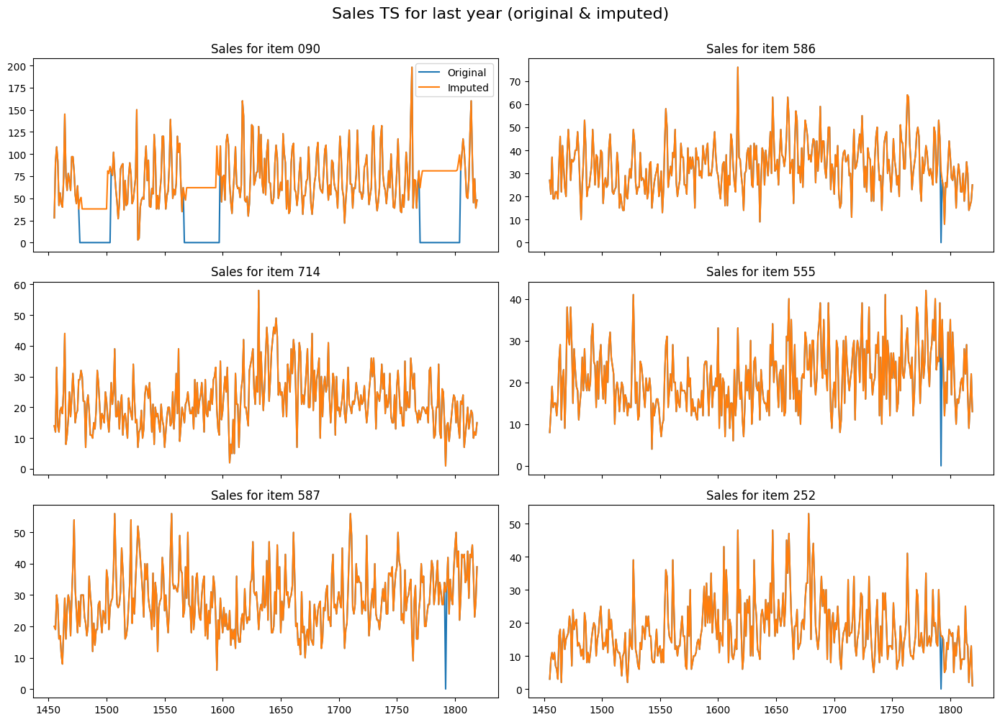

In [ ]:
fig, axes = plt.subplots(3, 2, figsize=(14, 10), sharex=True)

for ax, item in zip(axes.flatten(), high_sell_items):
    item_sales = sales[sales["item_id"] == item][-365:]
    ax.plot(item_sales["date_id"], item_sales["cnt"], label="Original")
    imputed = MAIN_CLASS._apply_imputation(item_sales["cnt"])
    ax.plot(item_sales["date_id"], imputed, label="Imputed")
    ax.set_title(f"Sales for item {item}")

fig.suptitle("Sales TS for last year (original & imputed)", fontsize=16, y=1)
axes[0, 0].legend()
plt.tight_layout()
plt.show()

### Анализ dates

In [ ]:
dates.head()

,date,wm_yr_wk,weekday,wday,month,year,event_name_1,event_type_1,event_name_2,event_type_2,date_id,cashback
0,2011-01-29,11101,Saturday,1,1,2011,NaN,NaN,NaN,NaN,1,0
1,2011-01-30,11101,Sunday,2,1,2011,NaN,NaN,NaN,NaN,2,0
2,2011-01-31,11101,Monday,3,1,2011,NaN,NaN,NaN,NaN,3,0
3,2011-02-01,11101,Tuesday,4,2,2011,NaN,NaN,NaN,NaN,4,0
4,2011-02-02,11101,Wednesday,5,2,2011,NaN,NaN,NaN,NaN,5,1


In [ ]:
dates["date"] = pd.to_datetime(dates["date"])

In [ ]:
cashback_store_1 = dates[dates["cashback"] == 1]
print(f"Number of days with cashback: {len(cashback_store_1)}")

Number of days with cashback: 600


In [ ]:
num_days_one_event = dates["event_name_1"].notna().sum()
num_days_two_events = (dates["event_name_1"].notna() & dates["event_name_2"].notna()).sum()

print(f"Number of days with one event: {num_days_one_event}")
print(f"Number of days with two events: {num_days_two_events}")

Number of days with one event: 146
Number of days with two events: 4


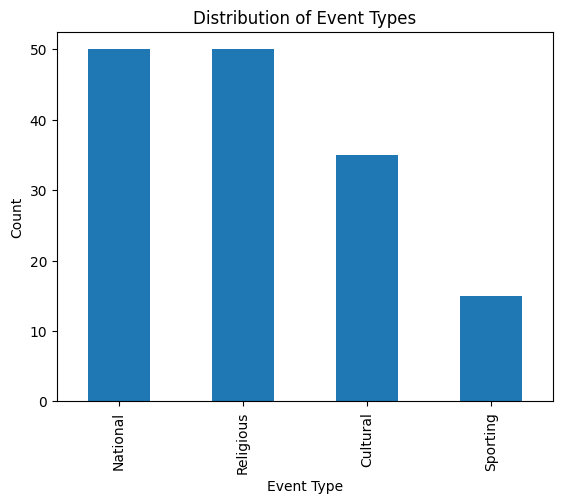

In [ ]:
event_types = pd.concat([dates["event_type_1"], dates["event_type_2"]])
event_types = event_types.dropna()

event_types.value_counts().plot(kind="bar")
plt.title("Distribution of Event Types")
plt.xlabel("Event Type")
plt.ylabel("Count")
plt.show()

Можно собрать следующие фичи:

- Календарные:
    
    - День недели (1-7)
    - День месяца (1-31)
    - Номер месяца (1-12)

- Праздники:
    - Праздники у нас бывают 4 типов, значит можем сделать one-hot кодирование для каждого типа (т.е. получим 8 бинарных колонок)

- Остальное:
    
    - cashback (0 или 1)

### Анализ prices

In [ ]:
prices.head()

,item_id,wm_yr_wk,sell_price
22,064,11101,2.54
23,065,11101,2.94
24,376,11101,1.98
25,090,11101,1.25
26,252,11101,1.48


In [ ]:
prices.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3873 entries, 22 to 11140
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   item_id     3873 non-null   object 
 1   wm_yr_wk    3873 non-null   int64  
 2   sell_price  3873 non-null   float64
dtypes: float64(1), int64(1), object(1)
memory usage: 121.0+ KB


Цены указаны для каждой недели:

In [ ]:
for item_id in unique_items:
    print(item_id, len(sales[sales["item_id"] == item_id]), len(prices[prices["item_id"] == item_id]) * 7)

064 1216 1820
065 1216 1820
325 1216 1631
376 1216 1820
090 1216 1820
252 1216 1820
339 1216 1820
546 1216 1820
547 1216 1820
555 1216 1820
584 1216 1820
586 1216 1820
587 1216 1820
714 1216 1820
727 1216 1820


`sell_price` тоже будем использовать как фичу.

## Применим препроцессинг

Итоговый препроцессинг:

- train:

  - выбираем данные только для нашего магазина
  - соединяем данные по продажам из разных таблиц в одну (продажи, календарные данные, цена)
  - заполняем нулевые значения (у high-seller товаров)
  - отсекаем старые значения (для моделей разных горизонтов планирования - разные отсечки)
  - применяем экспоненциальное сглаживание (если надо)

- val/test:

  - всё как и в train, только без заполнения нулевыми значениями и экспоненциального сглаживания

Сделаем упрощенный (выберем данные, соединим и отсечем старые) препроцессинг и проанализируем каждый ВР (для дальнейшего подбора гиперпараметров для моделей семейста ARMA).

In [ ]:
sales = pd.read_csv("./data/shop_sales.csv")
dates = pd.read_csv("./data/shop_sales_dates.csv")
prices = pd.read_csv("./data/shop_sales_prices.csv")

In [ ]:
TRAIN_VAL_SIZE = (2 + 1) * 365
TEST_SIZE = max(7, 30, 120)

cutoff_date_id = sales["date_id"].max() - TRAIN_VAL_SIZE - TEST_SIZE

In [ ]:
data = MAIN_CLASS.preprocess_data(sales, dates, prices, 1, cutoff_date_id=cutoff_date_id)

data["date_id"].min(), data["date_id"].max()

(605, 1819)

In [38]:
data.head()

,item_id,date_id,wday,cashback,sell_price,day,month,year,event_type_1_Cultural,event_type_1_National,event_type_1_NoEvent,event_type_1_Religious,event_type_1_Sporting,event_type_2_Cultural,event_type_2_NoEvent,event_type_2_Religious,target
0,064,605,3,0,2.54,24,9,2012,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1
1,587,605,3,0,2.68,24,9,2012,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,26
2,376,605,3,0,1.98,24,9,2012,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0
3,547,605,3,0,0.20,24,9,2012,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1
4,555,605,3,0,1.58,24,9,2012,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,32


## По каждому товару

В этой секции проанализирую ВР каждого товара на предмет тренда, сезонности, автокорреляций.

### Item 064

In [ ]:
item_id = "064"
item_data = data[data["item_id"] == item_id].sort_values("date_id").reset_index(drop=True)
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
0,064,605,3,NaN,NaN,0,2.54,24,9,2012,1
1,064,606,4,NaN,NaN,0,2.54,25,9,2012,0
2,064,607,5,NaN,NaN,0,2.54,26,9,2012,1
3,064,608,6,NaN,NaN,0,2.54,27,9,2012,0
4,064,609,7,NaN,NaN,0,2.54,28,9,2012,1


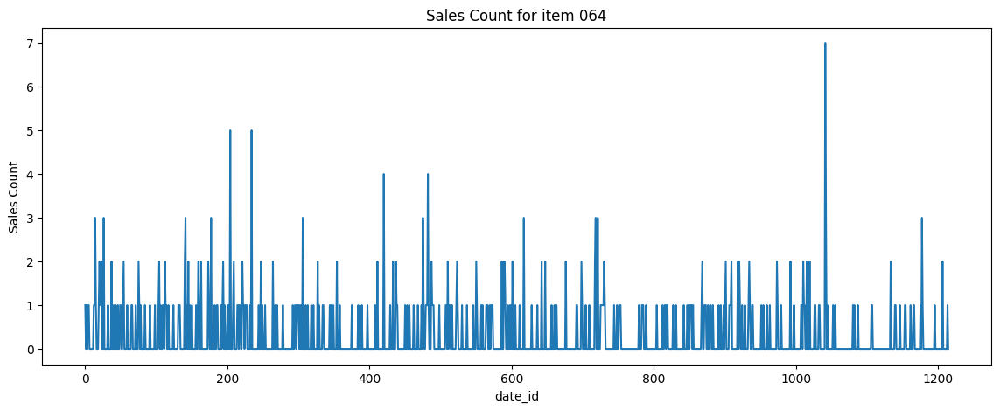

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.index, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

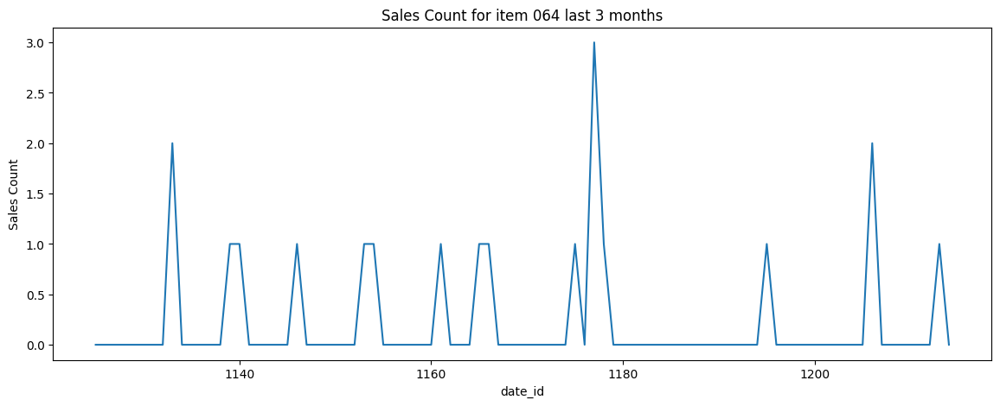

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.index[-90:], item_data.target[-90:])
plt.title(f"Sales Count for item {item_id} last 3 months")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

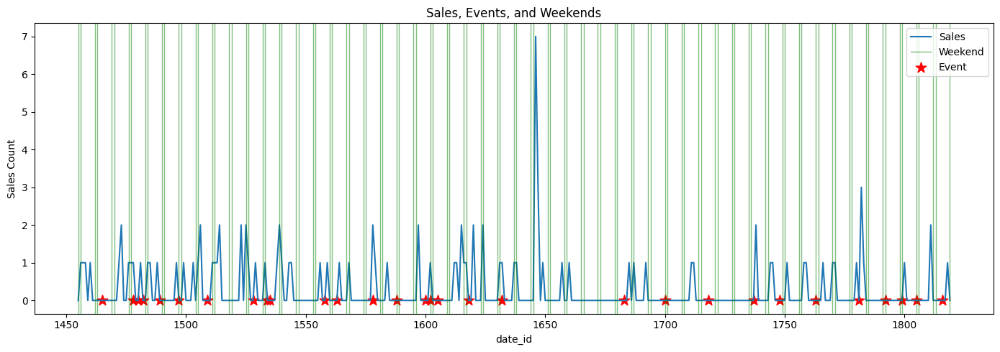

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

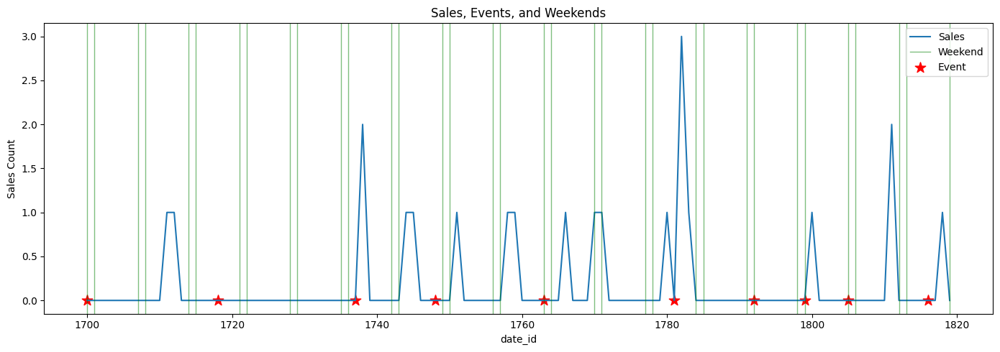

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Маленькое число продаж - поэтому сложно определить сезонность/тренд/корреляцию с праздниками/выходными.

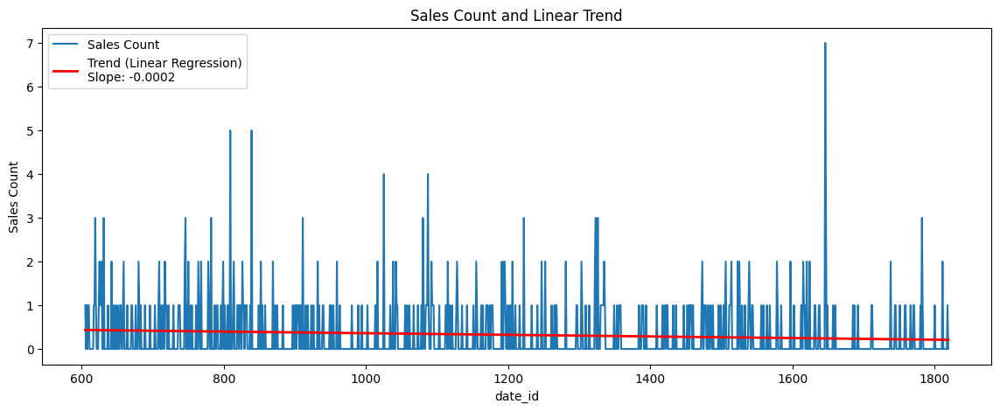

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.0})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)

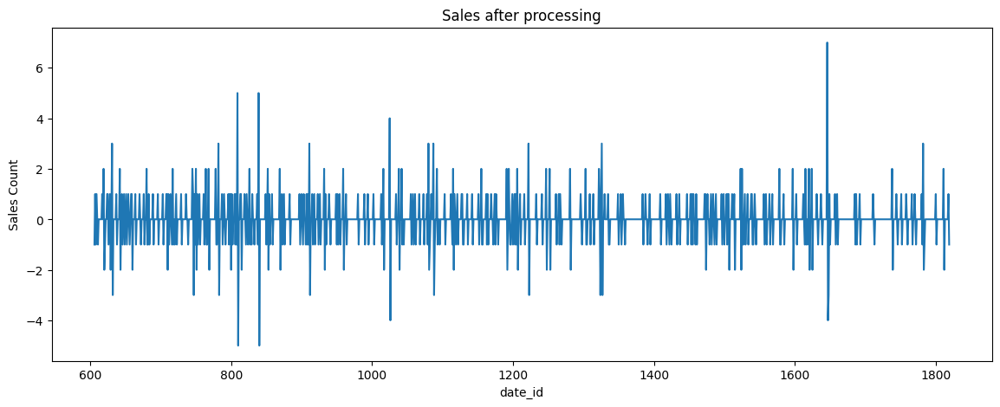

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 7.696088757343933e-21})

Теперь статистические тесты указывают на то, что ряд стационарен.

Построим графики ACF и PACF для этого стационарного ряда.

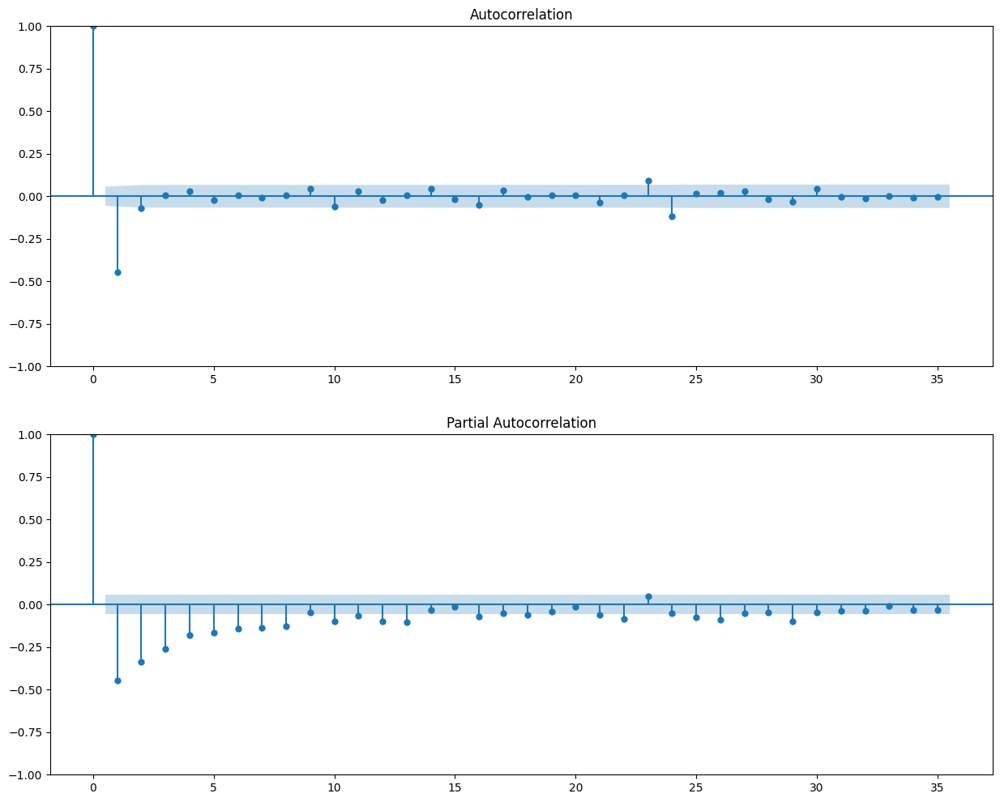

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 23, 24]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 16, 18, 21, 22, 25, 26, 29]


Большое кол-во статзначимых лагов в ACF и PACF говорит о том, что значения ряда имеют много зависимостей от предыдущих значений.

Также эти рассчитанные лаги будут нужны нам для определения оптимальных гиперпараметров AR и MA частей моделей SARIMA(X).

### Item 065

In [ ]:
item_id = "065"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
2423,065,605,3,NaN,NaN,0,3.28,24,9,2012,0
2424,065,606,4,NaN,NaN,0,3.28,25,9,2012,0
2425,065,607,5,NaN,NaN,0,3.28,26,9,2012,0
2426,065,608,6,NaN,NaN,0,3.28,27,9,2012,2
2427,065,609,7,NaN,NaN,0,3.28,28,9,2012,0


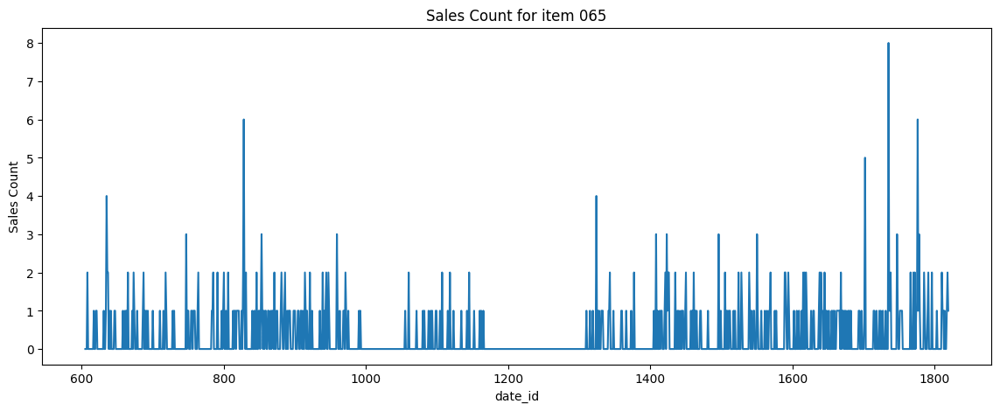

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

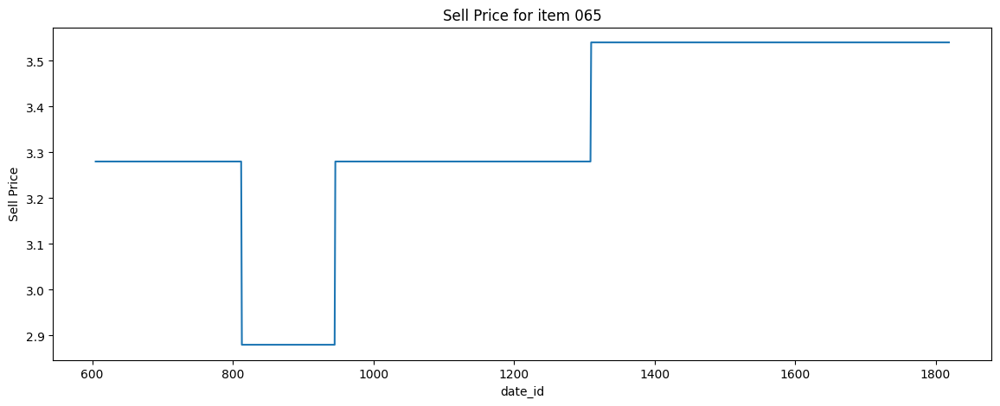

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

Нулевые продажи не зависят от цены товара.

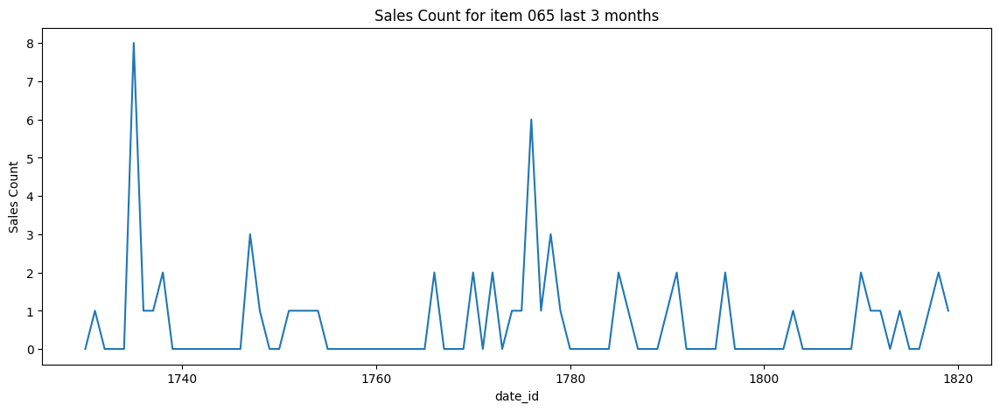

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-90:], item_data.target[-90:])
plt.title(f"Sales Count for item {item_id} last 3 months")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

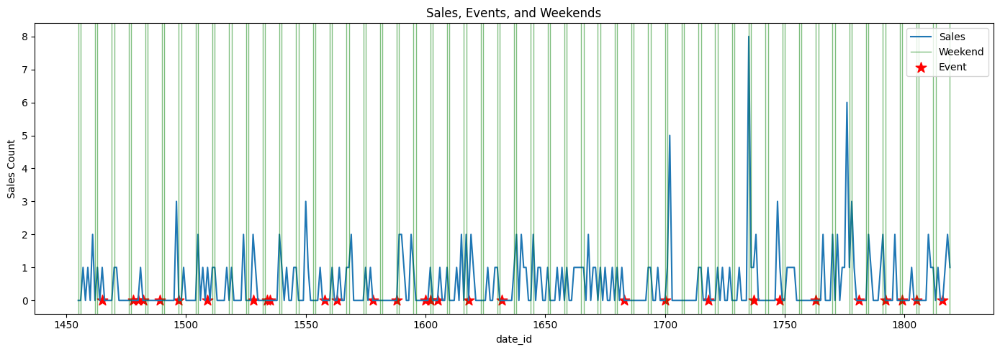

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

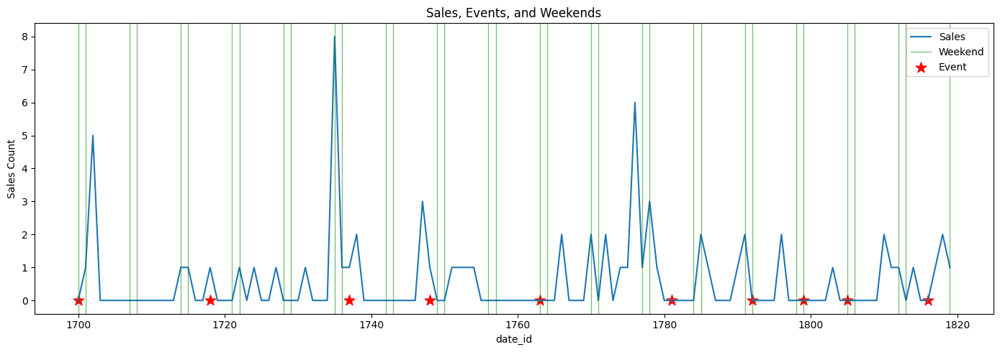

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Маленькое число продаж - поэтому сложно определить сезонность/тренд/корреляцию с праздниками/выходными.

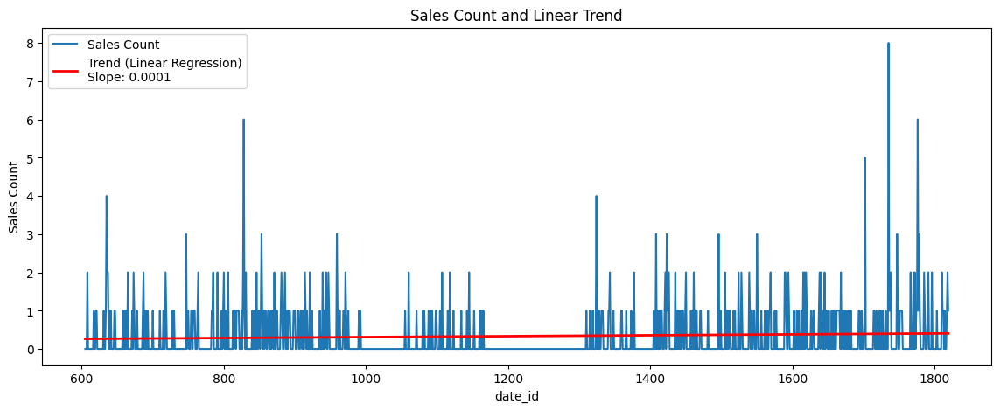

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

Видим, что линейного тренда тут точно нет (наклон 0).

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 5.787228859652847e-27})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)

/tmp/ipykernel_8121/705090826.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)


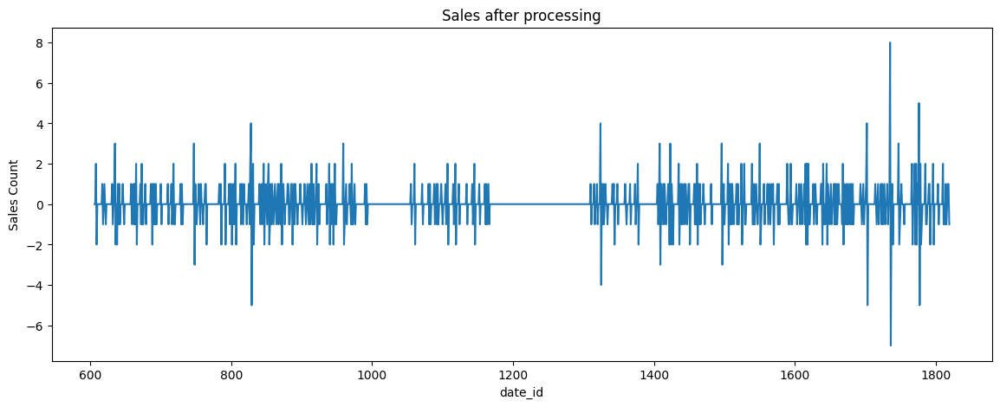

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 2.3168209565859962e-23})

Теперь статистические тесты указывают на то, что ряд стационарен.

Построим графики ACF и PACF для этого стационарного ряда.

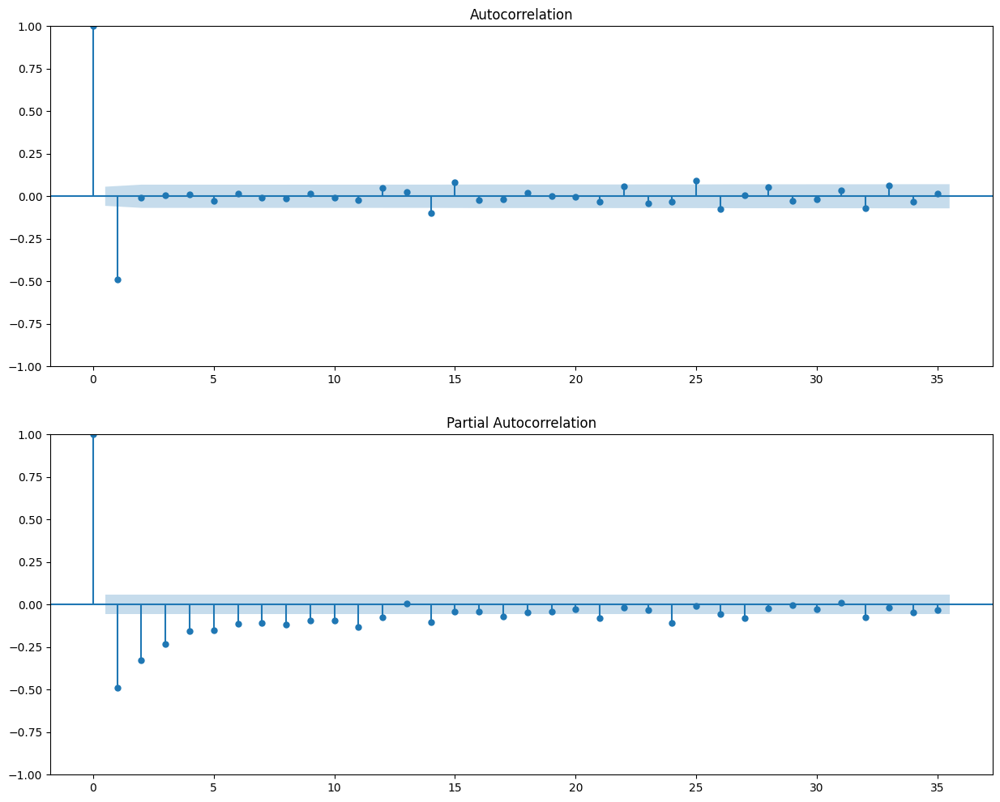

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 14, 15, 25, 26]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 17, 21, 24, 27, 32]


### Item 325

In [ ]:
item_id = "325"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
4242,325,605,3,NaN,NaN,0,1.14,24,9,2012,3
4243,325,606,4,NaN,NaN,0,1.14,25,9,2012,4
4244,325,607,5,NaN,NaN,0,1.14,26,9,2012,5
4245,325,608,6,NaN,NaN,0,1.14,27,9,2012,0
4246,325,609,7,NaN,NaN,0,1.14,28,9,2012,3


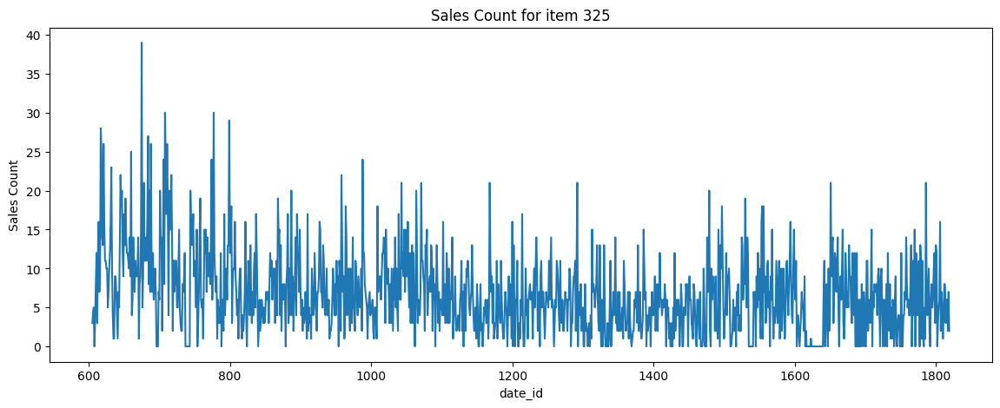

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

Наблюдаем небольшой нисходящий тренд.

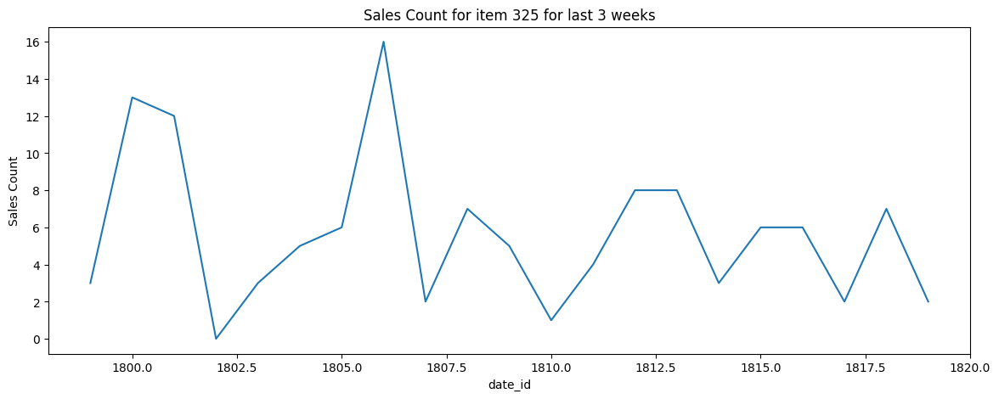

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} for last 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

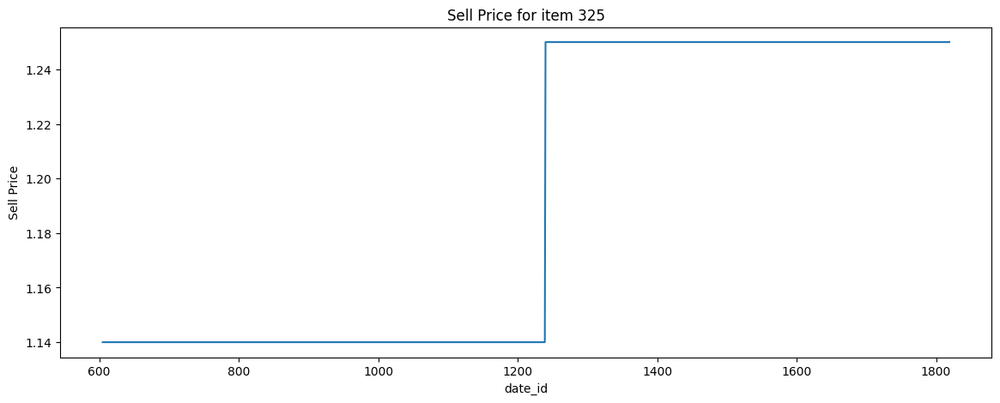

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

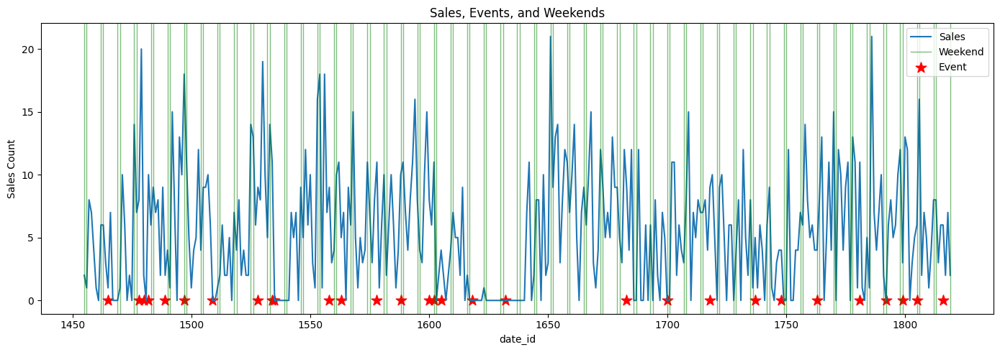

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

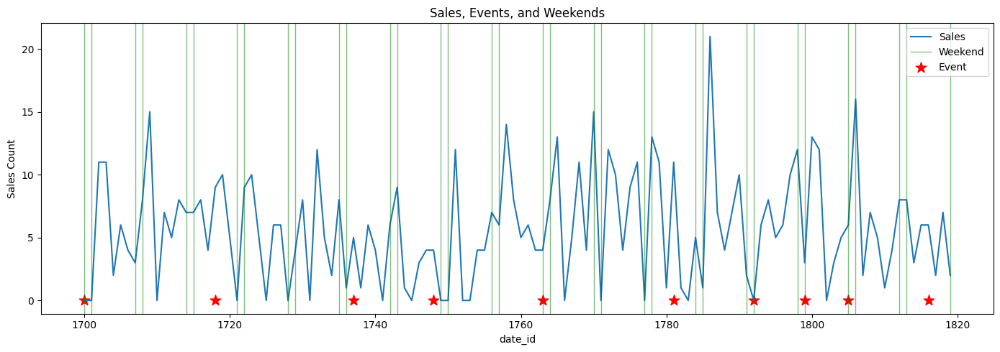

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Сезонности не наблюдается.  
Корреляции продаж с праздниками/выходными не наблюдается.

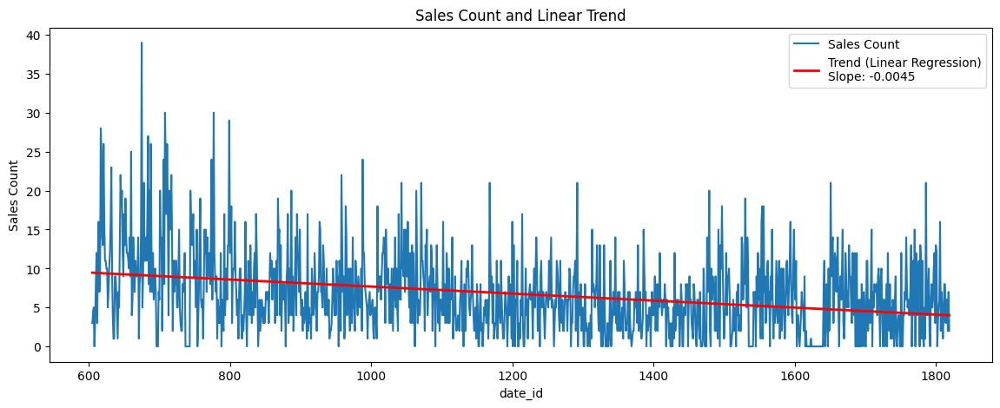

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 2.3746089531941076e-10})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии ВР
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)
item_data.loc[:, "target_st"] = item_data.target_st - item_data.target_st.shift(1)

/tmp/ipykernel_8121/3748228115.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)


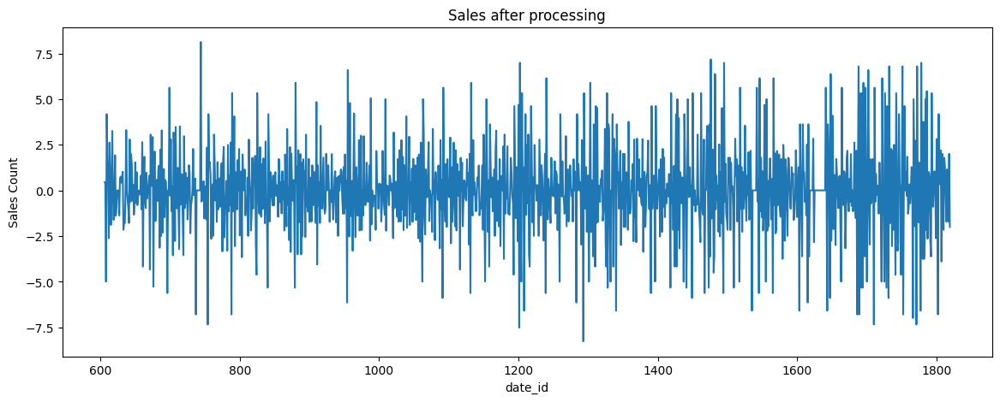

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 9.092473447035609e-22})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

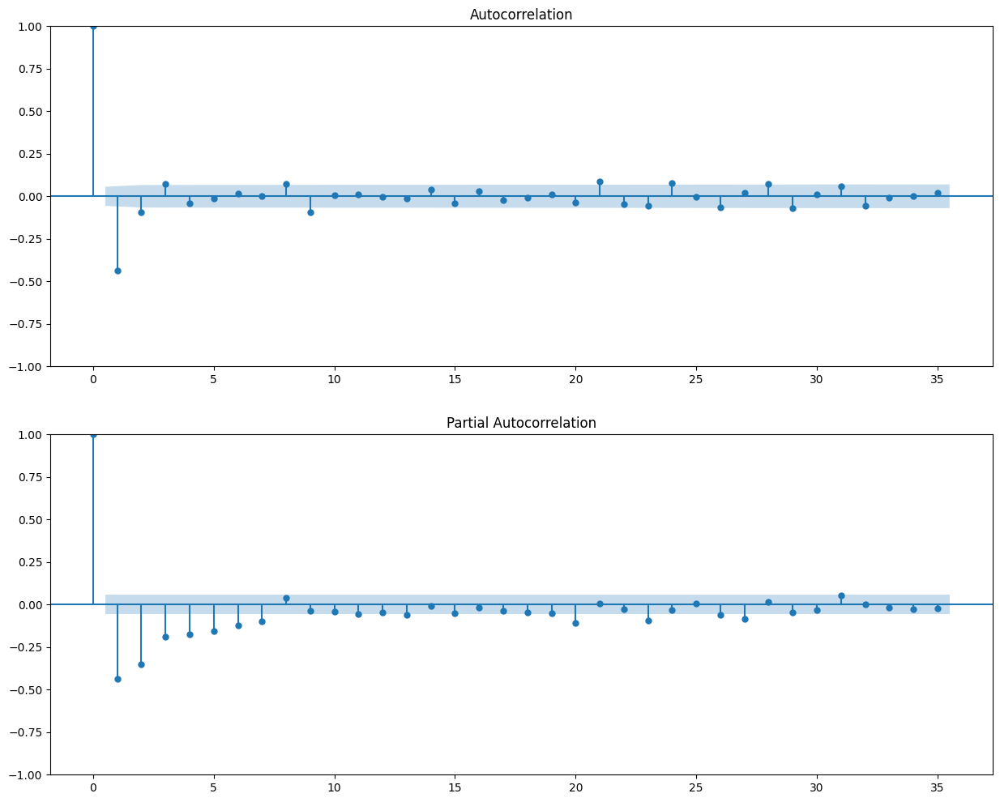

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 8, 9, 21, 24, 28, 29]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 13, 20, 23, 26, 27]


### Item 376

In [ ]:
item_id = "376"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
6061,376,605,3,NaN,NaN,0,1.98,24,9,2012,0
6062,376,606,4,NaN,NaN,0,1.98,25,9,2012,0
6063,376,607,5,NaN,NaN,0,1.98,26,9,2012,0
6064,376,608,6,NaN,NaN,0,1.98,27,9,2012,0
6065,376,609,7,NaN,NaN,0,1.98,28,9,2012,0


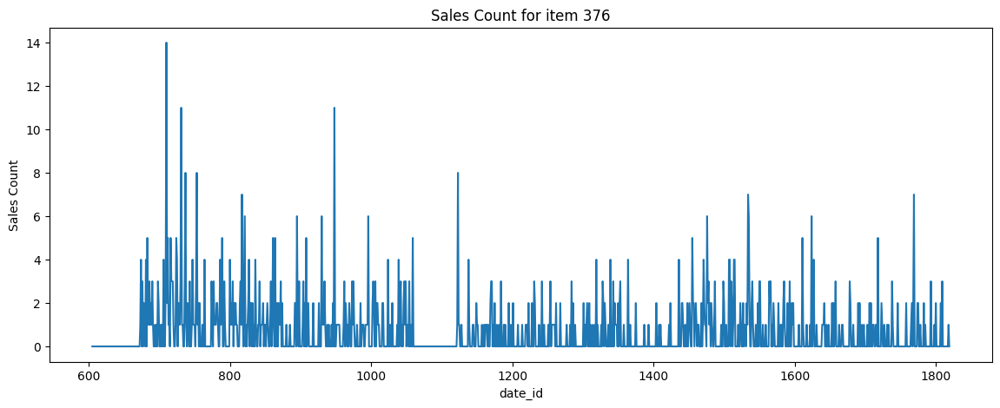

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

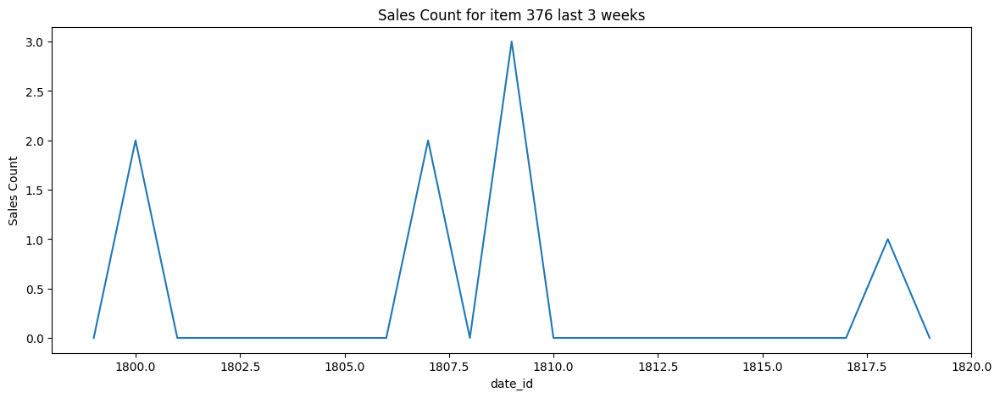

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} last 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

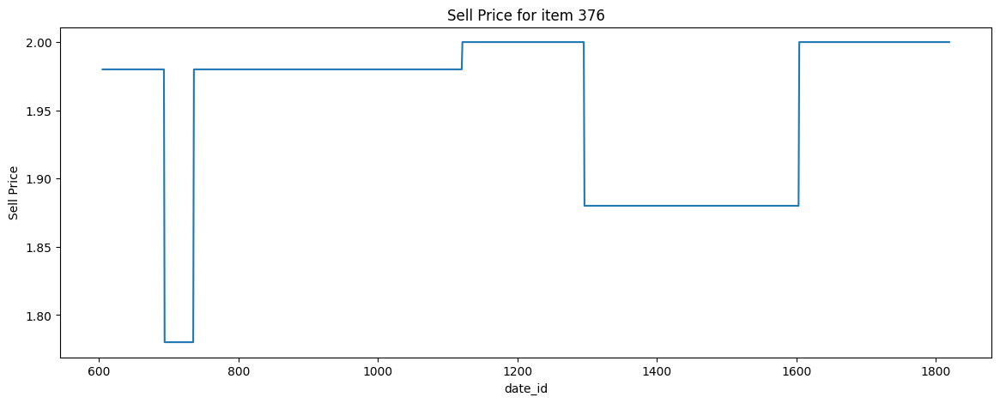

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

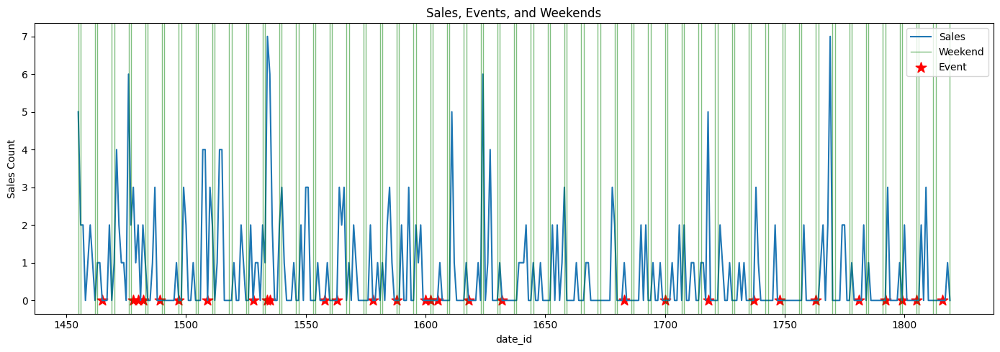

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

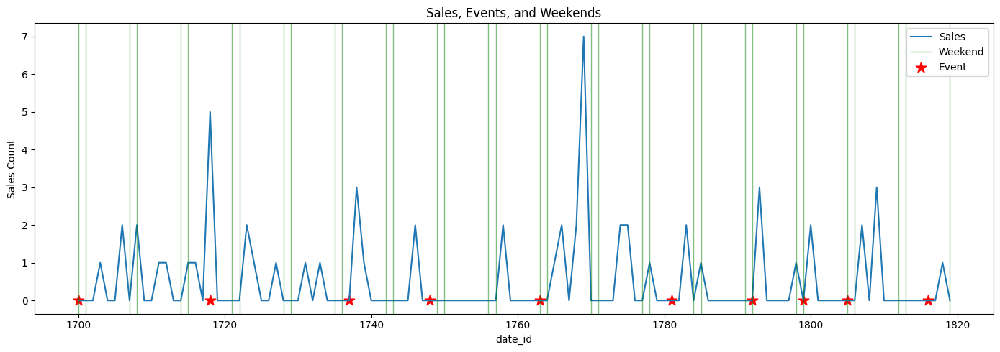

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Маленькое число продаж - поэтому сложно определить сезонность/тренд/корреляцию с праздниками/выходными.

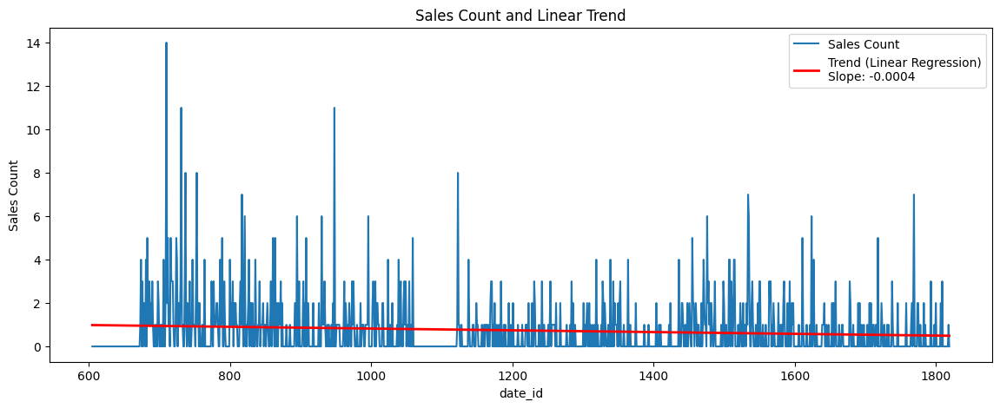

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 9.709025977622281e-05})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)
item_data.loc[:, "target_st"] = item_data.target_st - item_data.target_st.shift(1)

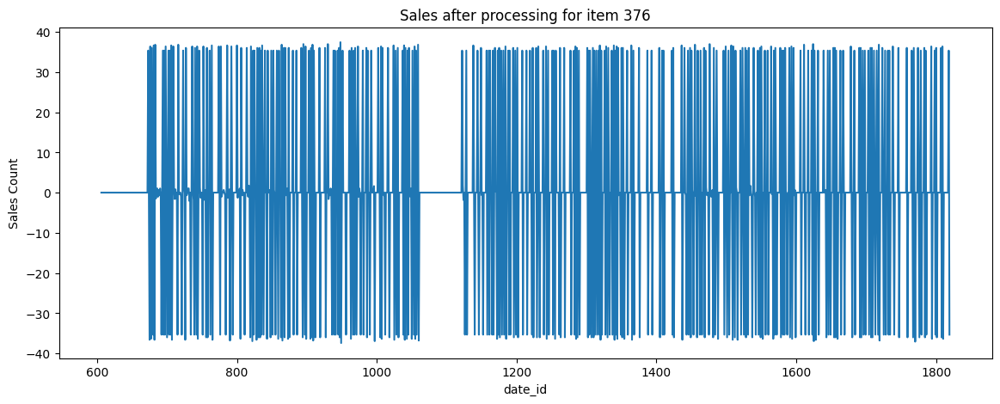

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 6.865736027539417e-23})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

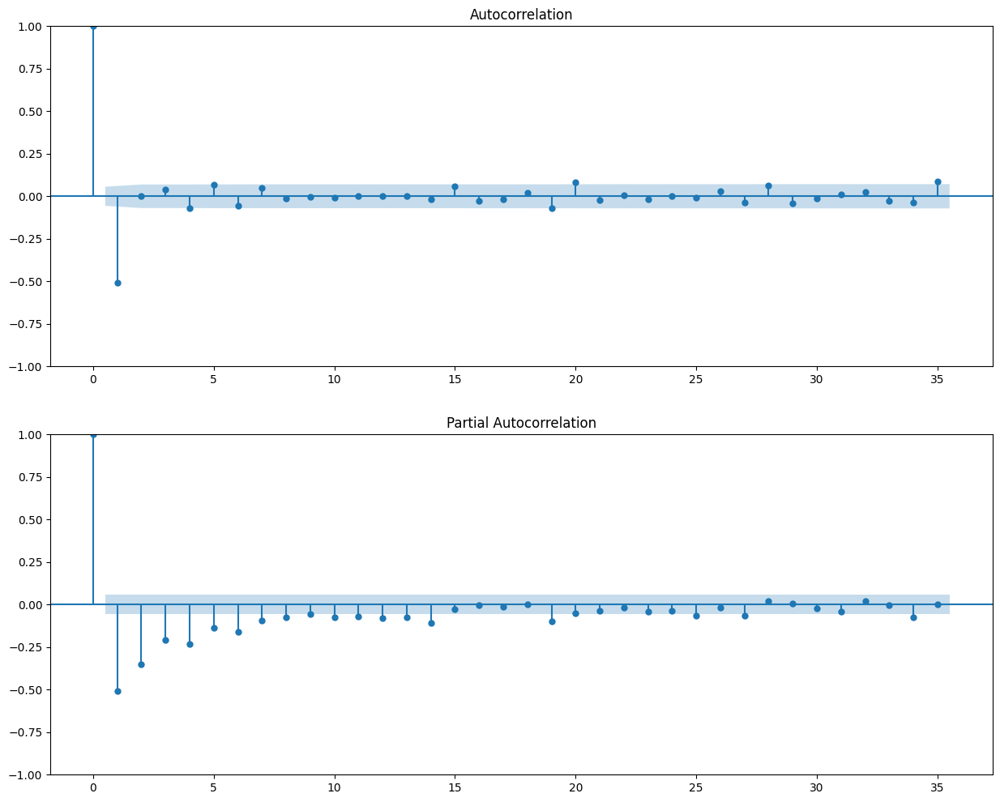

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 4, 20, 35]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 12, 13, 14, 19, 25, 27, 34]


### Item 090

In [ ]:
item_id = "090"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
7880,090,605,3,NaN,NaN,0,1.38,24,9,2012,36
7881,090,606,4,NaN,NaN,0,1.38,25,9,2012,63
7882,090,607,5,NaN,NaN,0,1.38,26,9,2012,39
7883,090,608,6,NaN,NaN,0,1.38,27,9,2012,61
7884,090,609,7,NaN,NaN,0,1.38,28,9,2012,81


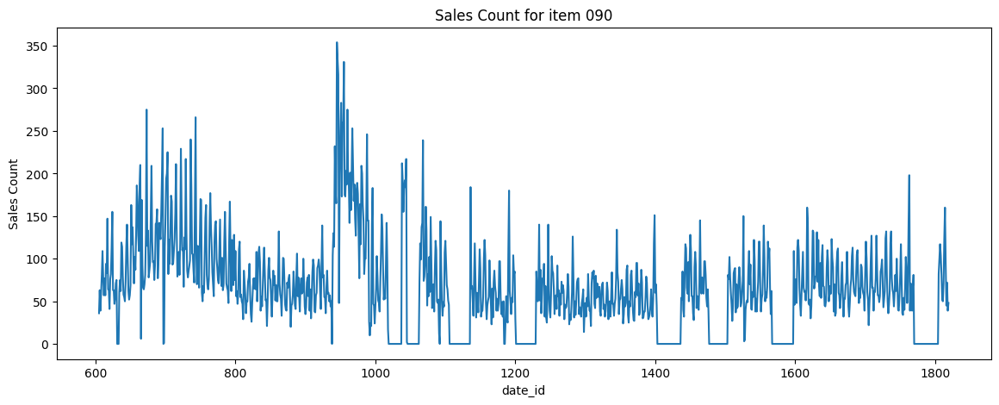

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

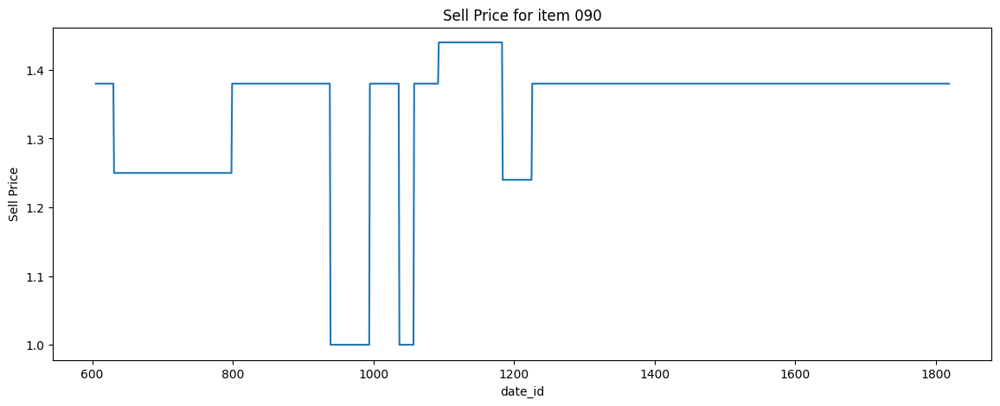

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

Скачок продаж (2013-08) случился из-за снижения цены почти на 50%.

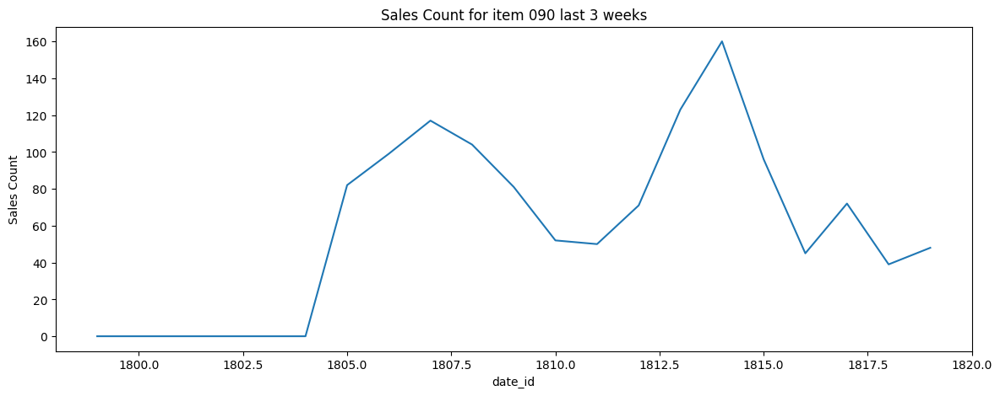

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} last 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

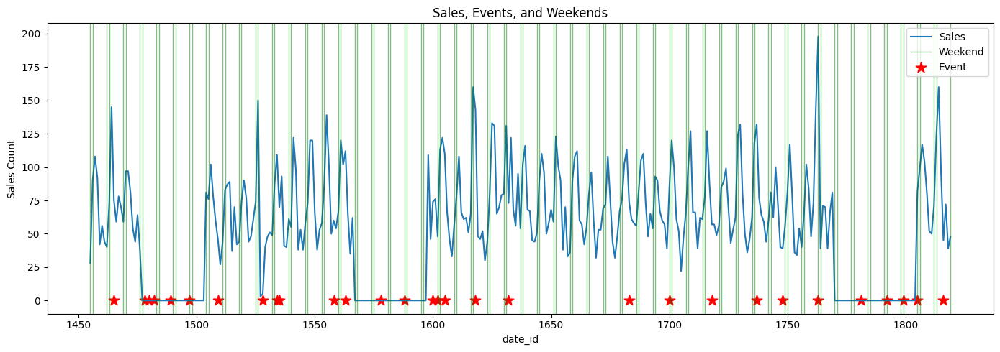

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

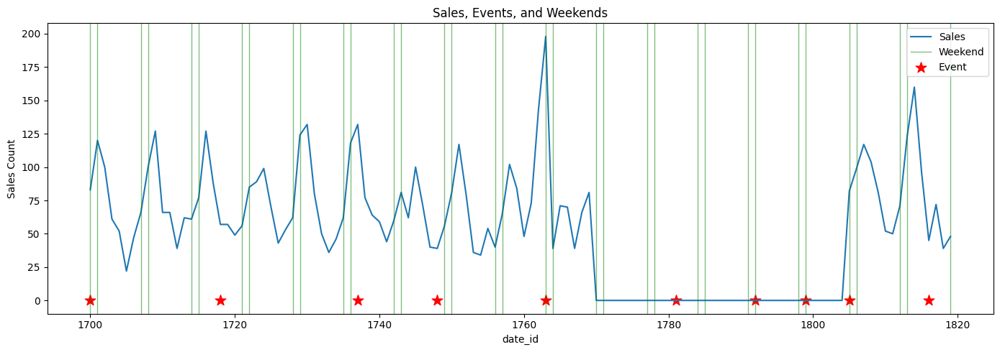

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренда не наблюдаем.  
Наблюдается недельный цикл - продажи начинают расти на выходных, ко вторнику достигают пика, а затем падают.  

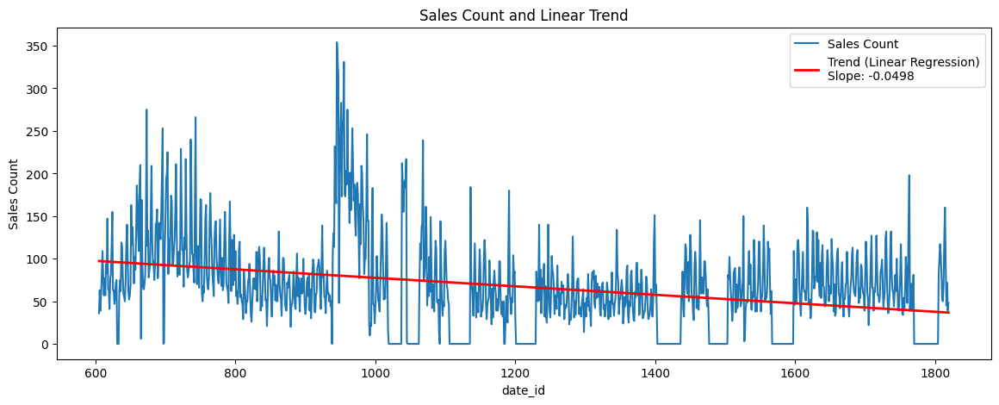

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.0033461056024878854})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)
item_data.loc[:, "target_st"] = item_data.target_st - item_data.target_st.shift(1)

/tmp/ipykernel_8121/3748228115.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)


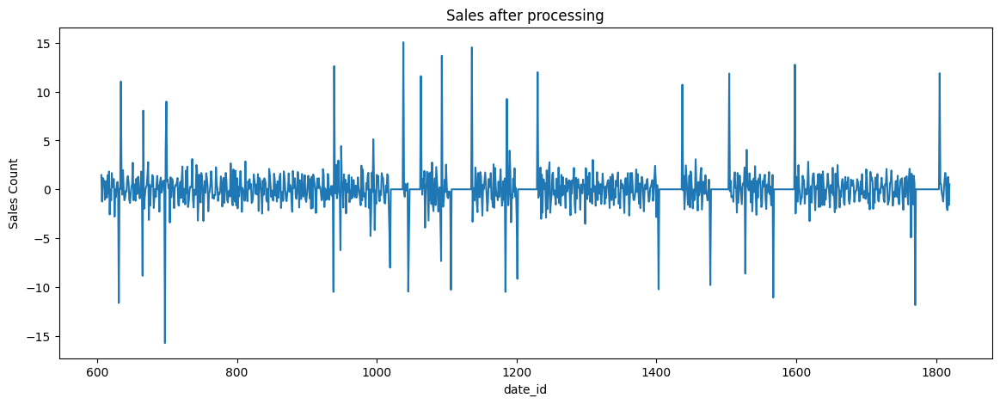

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 2.932519066296857e-17})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

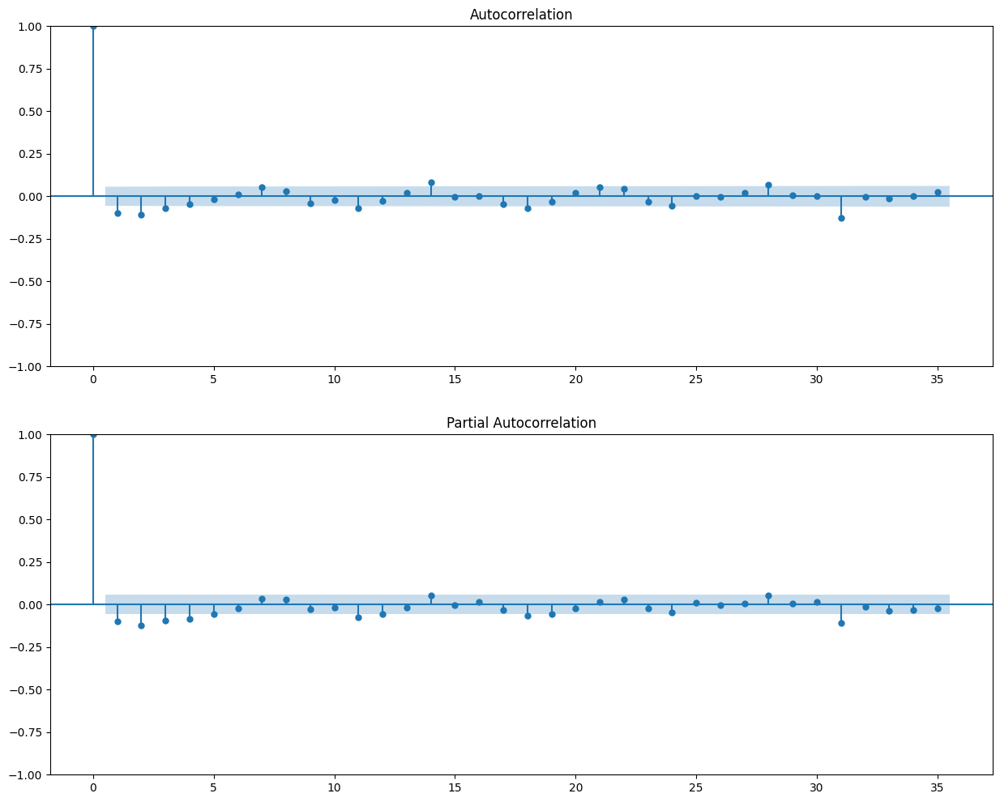

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 11, 14, 18, 28, 31]
Significant PACF lags: [0, 1, 2, 3, 4, 11, 18, 31]


### Item 252

In [ ]:
item_id = "252"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
9699,252,605,3,NaN,NaN,0,1.48,24,9,2012,15
9700,252,606,4,NaN,NaN,0,1.48,25,9,2012,20
9701,252,607,5,NaN,NaN,0,1.48,26,9,2012,17
9702,252,608,6,NaN,NaN,0,1.48,27,9,2012,27
9703,252,609,7,NaN,NaN,0,1.48,28,9,2012,34


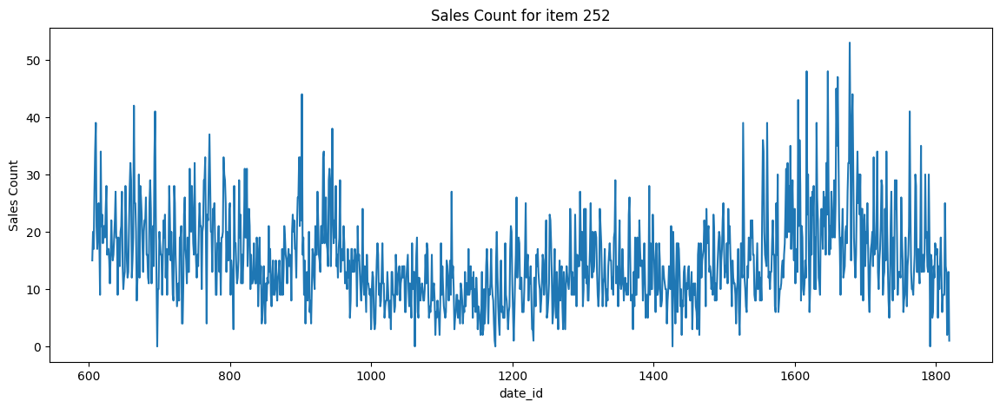

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

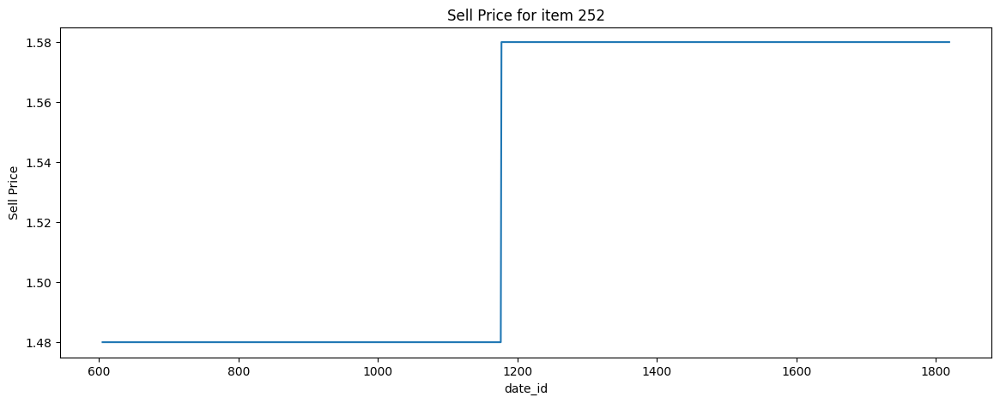

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

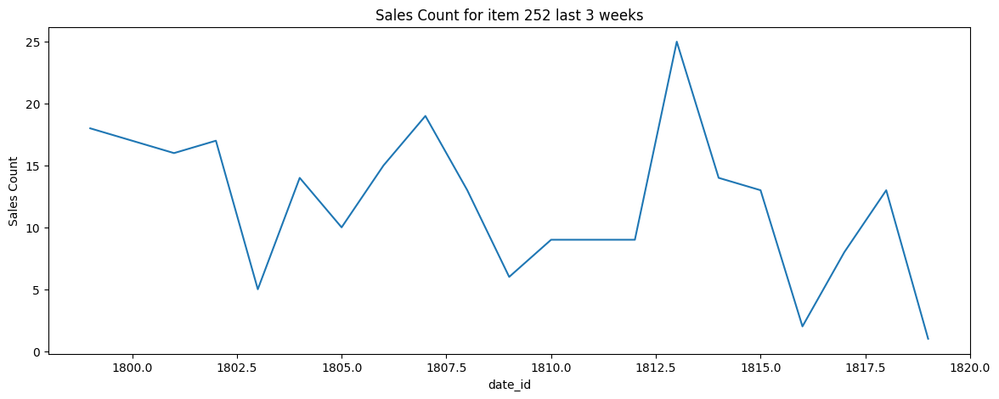

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} last 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

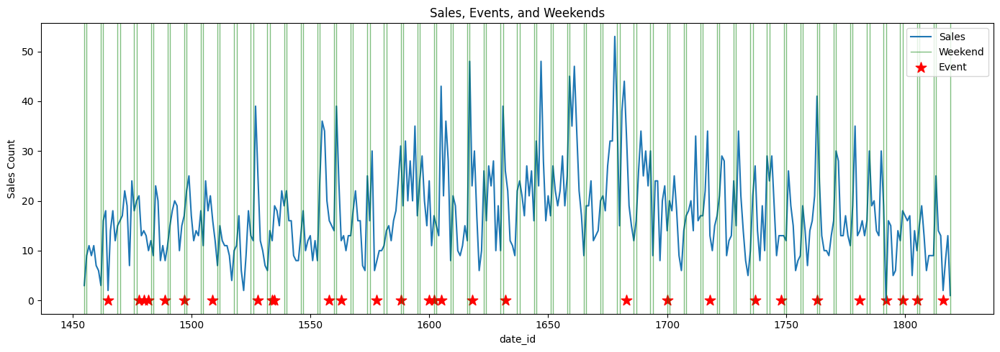

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

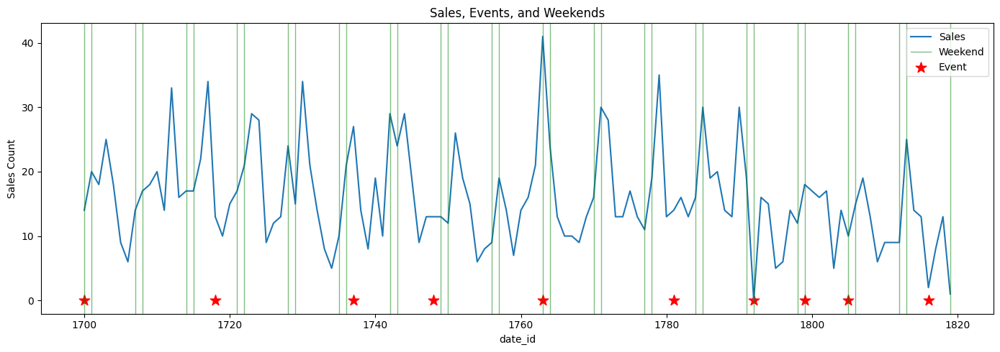

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Небольшой восходящий тренд.  
Сезонности не наблюдается.  

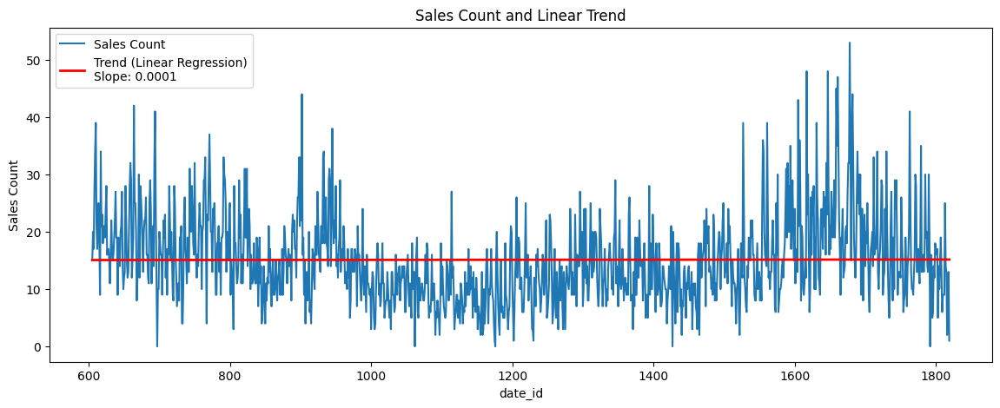

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.01661235050765275})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)
item_data.loc[:, "target_st"] = item_data.target_st - item_data.target_st.shift(1)

/tmp/ipykernel_8121/3748228115.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)


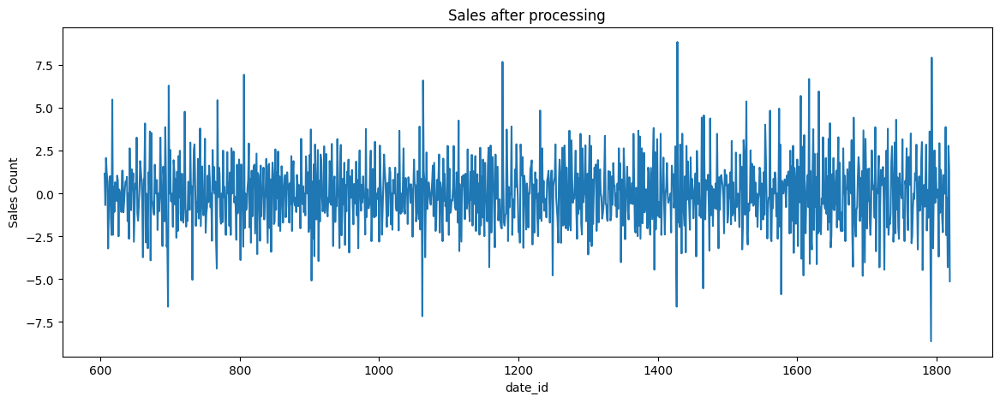

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 1.2885868979108838e-24})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

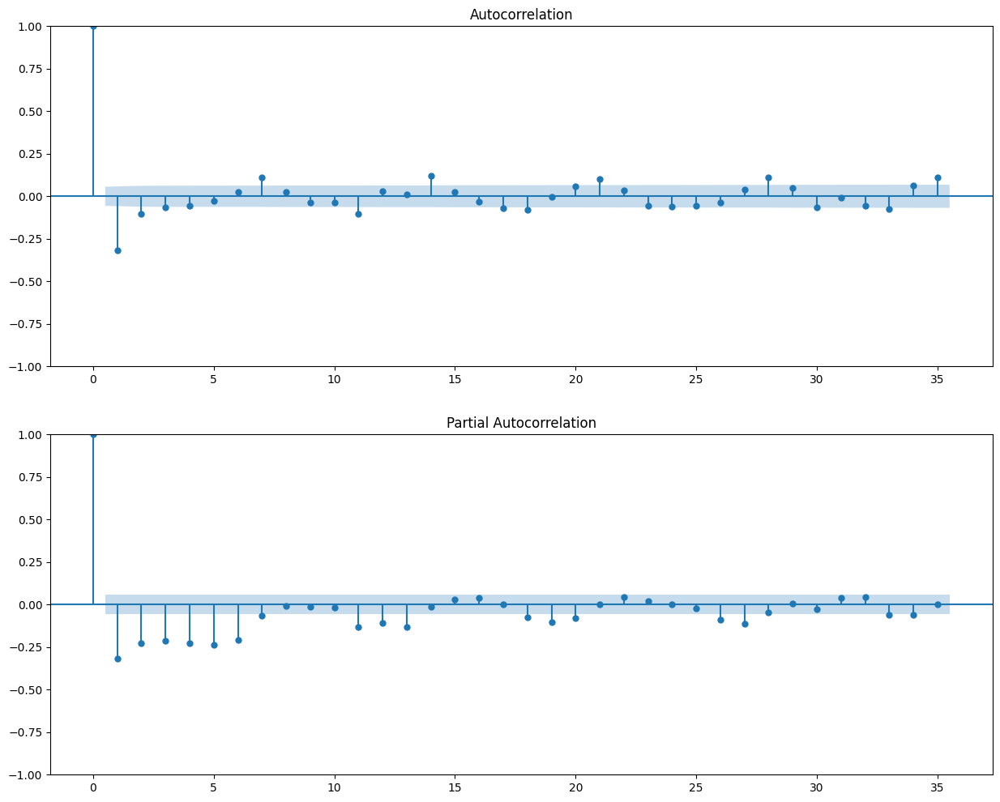

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 7, 11, 14, 17, 18, 21, 28, 33, 35]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 11, 12, 13, 18, 19, 20, 26, 27, 33, 34]


### Item 339

In [ ]:
item_id = "339"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
11518,339,605,3,NaN,NaN,0,0.78,24,9,2012,0
11519,339,606,4,NaN,NaN,0,0.78,25,9,2012,6
11520,339,607,5,NaN,NaN,0,0.78,26,9,2012,1
11521,339,608,6,NaN,NaN,0,0.78,27,9,2012,6
11522,339,609,7,NaN,NaN,0,0.78,28,9,2012,10


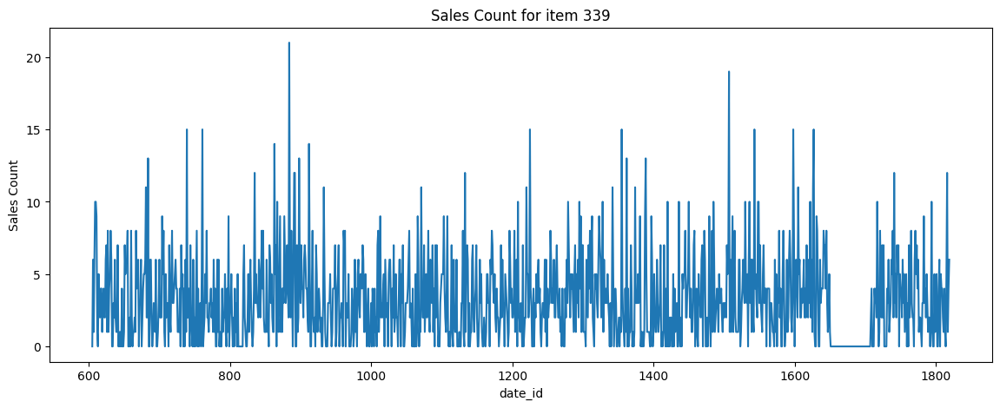

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

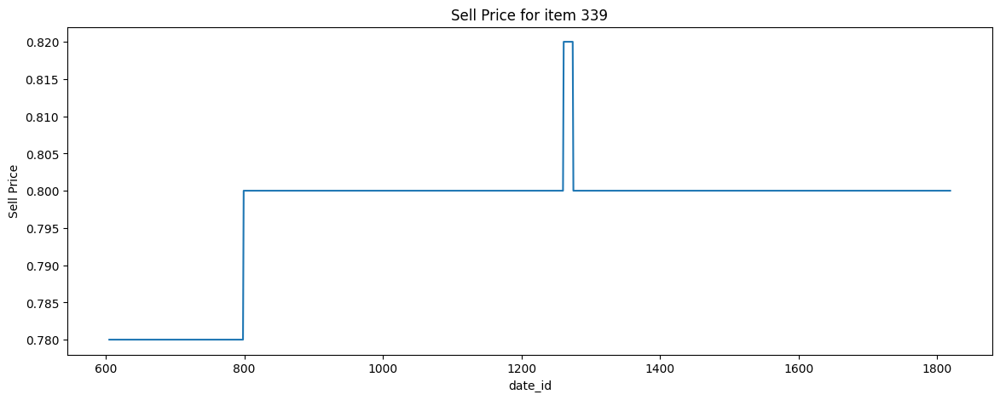

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

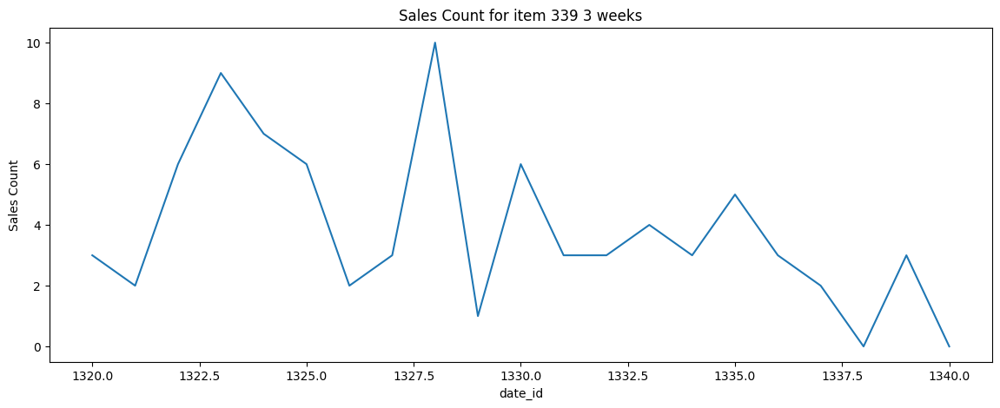

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-500:-479], item_data.target[-500:-479])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

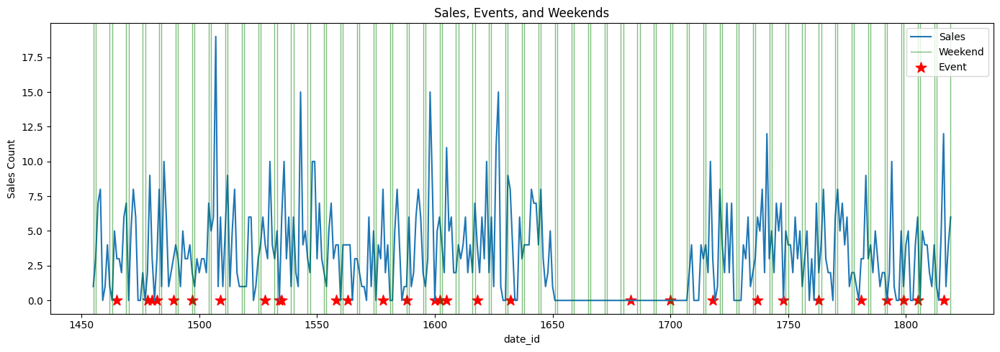

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

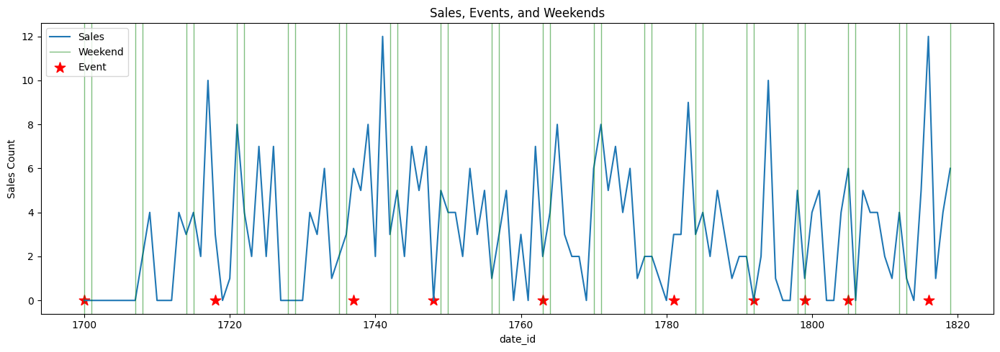

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд/сезонность не наблюдаются.  

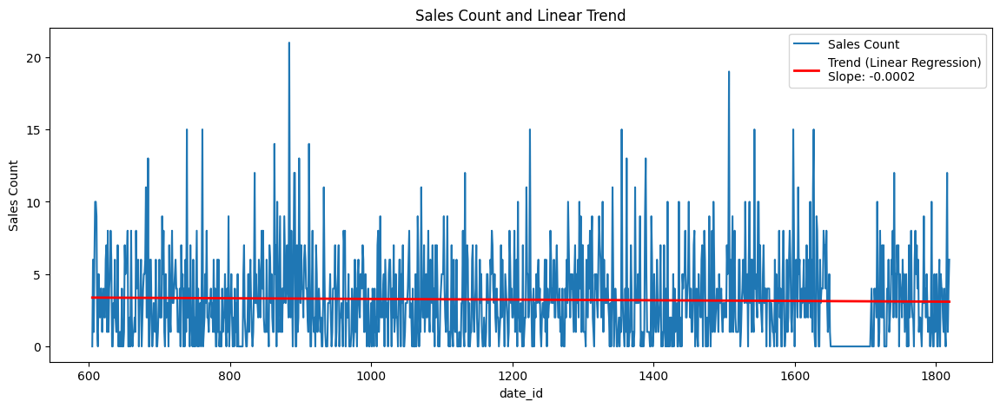

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 0.00021891453498440092})

Критерии говорят о том, что ряд стационарен - построим графики ACF и PACF.

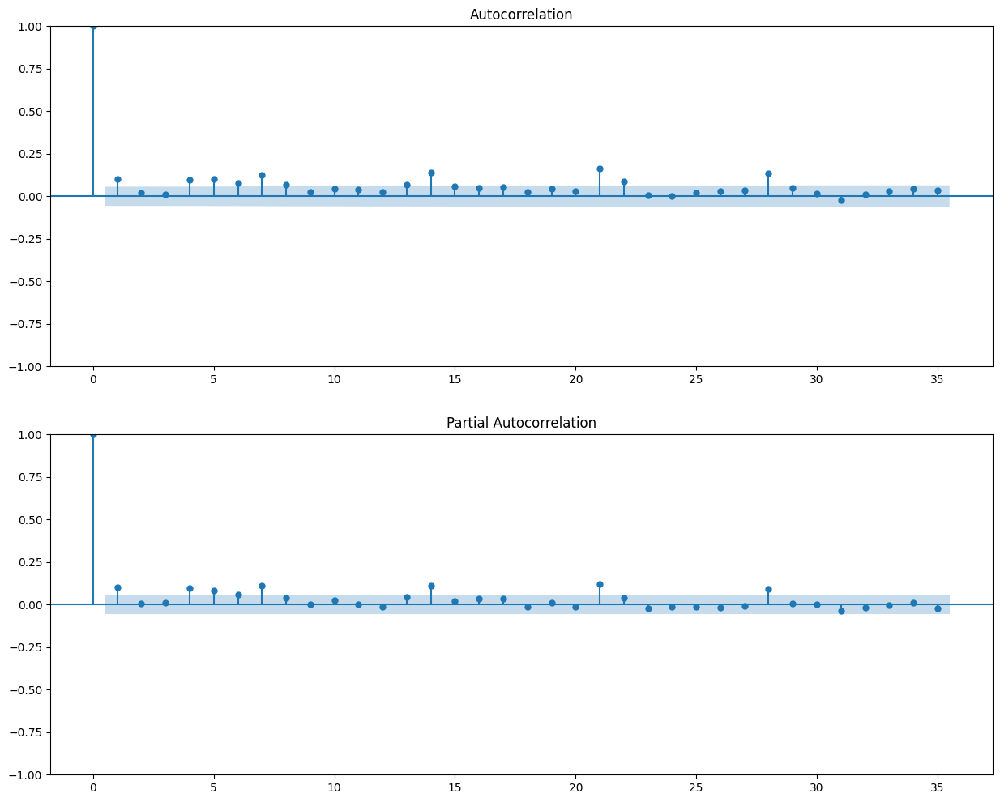

In [ ]:
fig, (acf_ax, pacf_ax) = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target.dropna(), ax=acf_ax, lags=35)
tsaplots.plot_pacf(item_data.target.dropna(), ax=pacf_ax, lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 4, 5, 6, 7, 8, 13, 14, 21, 22, 28]
Significant PACF lags: [0, 1, 4, 5, 6, 7, 14, 21, 28]


### Item 546

In [ ]:
item_id = "546"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
13337,546,605,3,NaN,NaN,0,5.98,24,9,2012,3
13338,546,606,4,NaN,NaN,0,5.98,25,9,2012,2
13339,546,607,5,NaN,NaN,0,5.98,26,9,2012,4
13340,546,608,6,NaN,NaN,0,5.98,27,9,2012,0
13341,546,609,7,NaN,NaN,0,5.98,28,9,2012,2


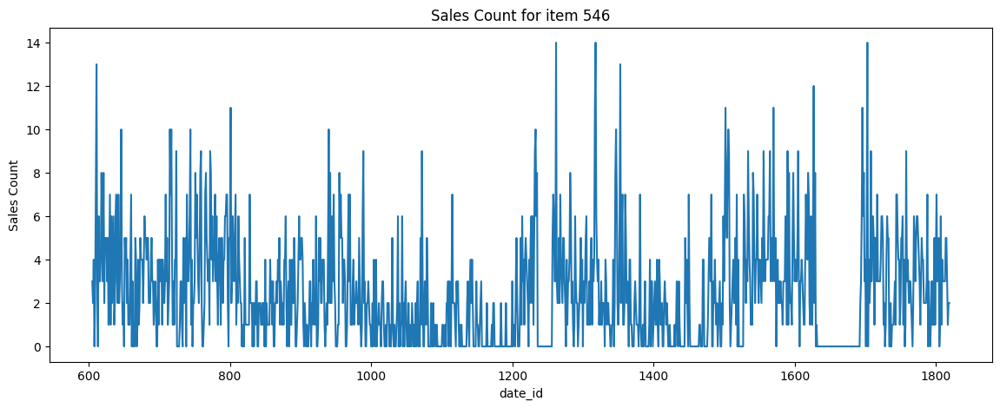

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

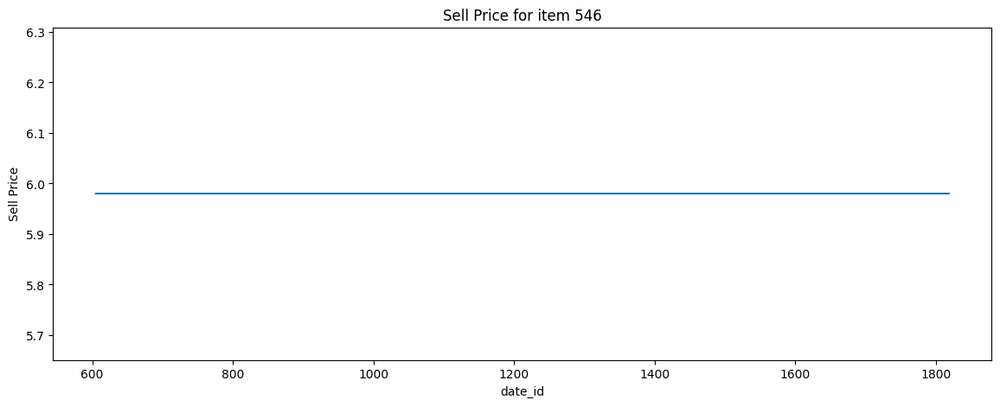

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

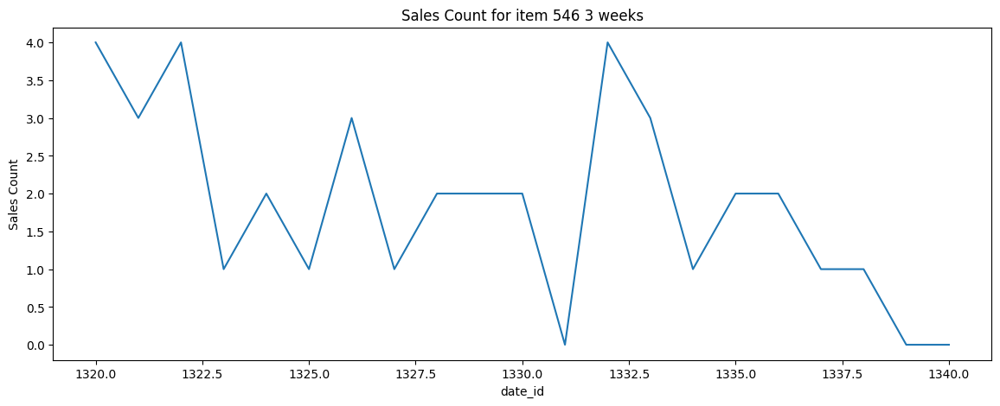

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-500:-479], item_data.target[-500:-479])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

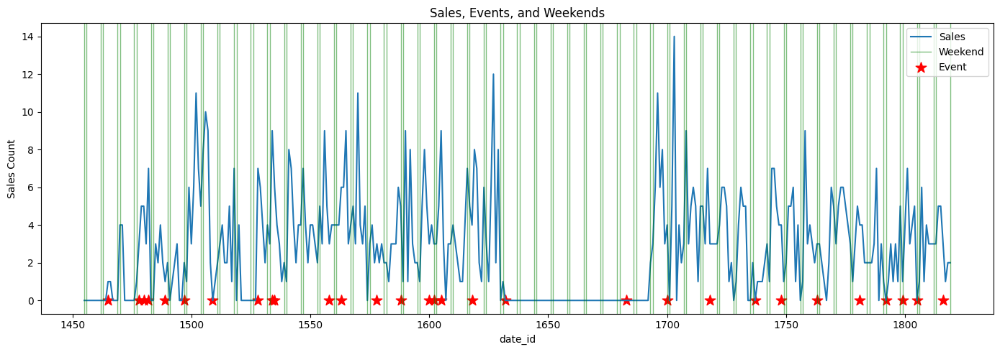

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

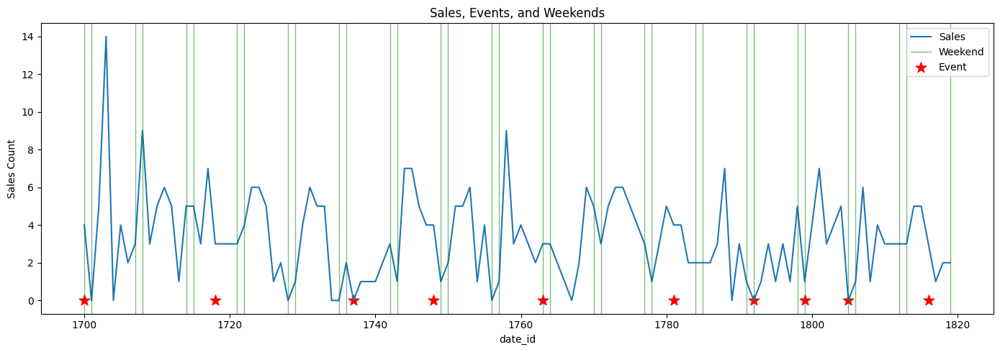

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд скорее восходящий.  
Сезонности не наблюдается.  
Корреляции с выходными/праздниками не наблюдается.

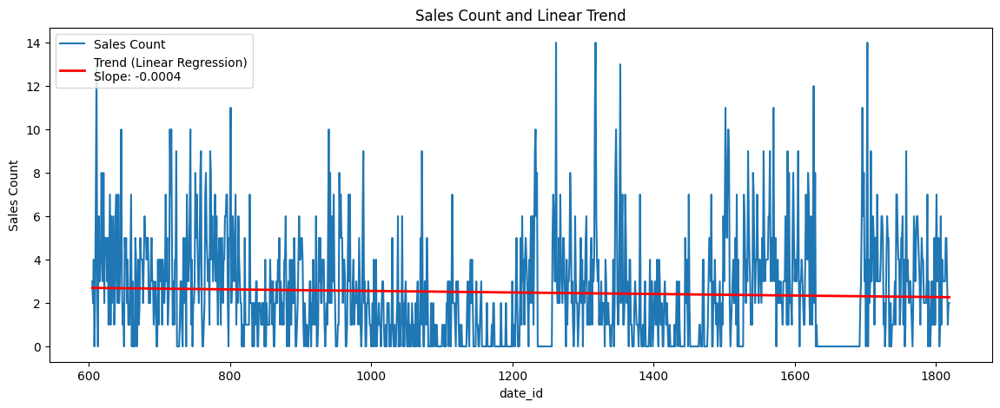

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

(False, {'KPSS': 0.06067735051828274, 'ADF': 1.6165595193575266e-06})

Ряд стационарен.  
Построим графики ACF и PACF для этого стационарного ряда.

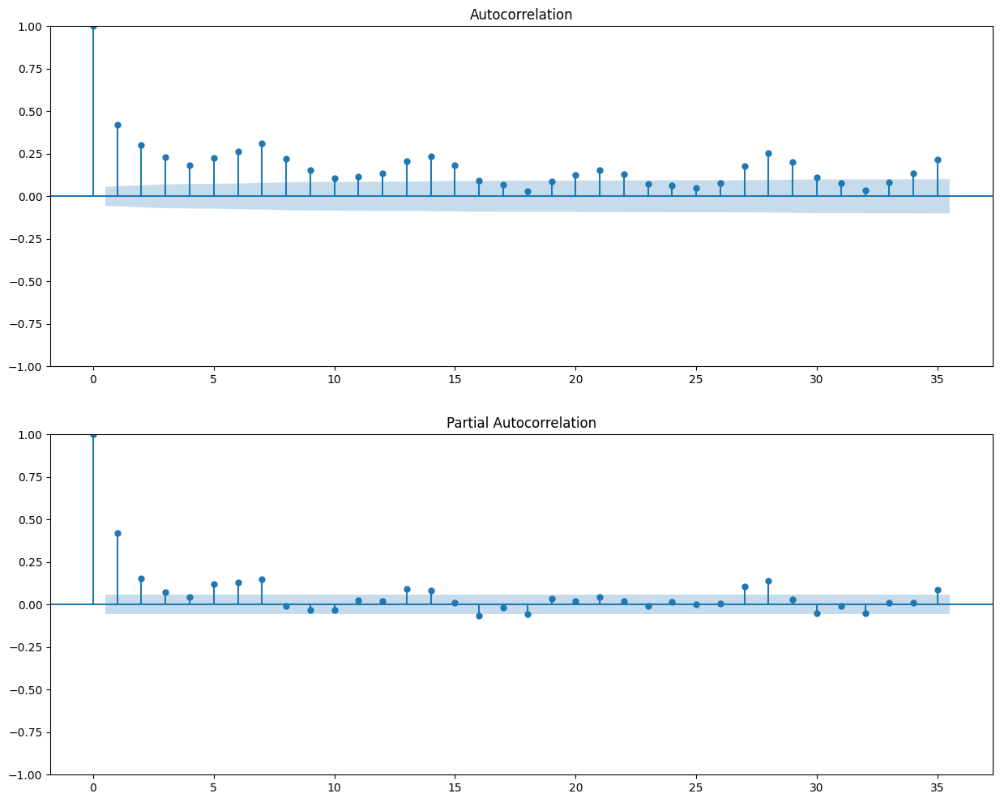

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 20, 21, 22, 27, 28, 29, 30, 34, 35]
Significant PACF lags: [0, 1, 2, 3, 5, 6, 7, 13, 14, 16, 18, 27, 28, 35]


### Item 547

In [ ]:
item_id = "547"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
15156,547,605,3,NaN,NaN,0,0.2,24,9,2012,1
15157,547,606,4,NaN,NaN,0,0.2,25,9,2012,20
15158,547,607,5,NaN,NaN,0,0.2,26,9,2012,26
15159,547,608,6,NaN,NaN,0,0.2,27,9,2012,45
15160,547,609,7,NaN,NaN,0,0.2,28,9,2012,11


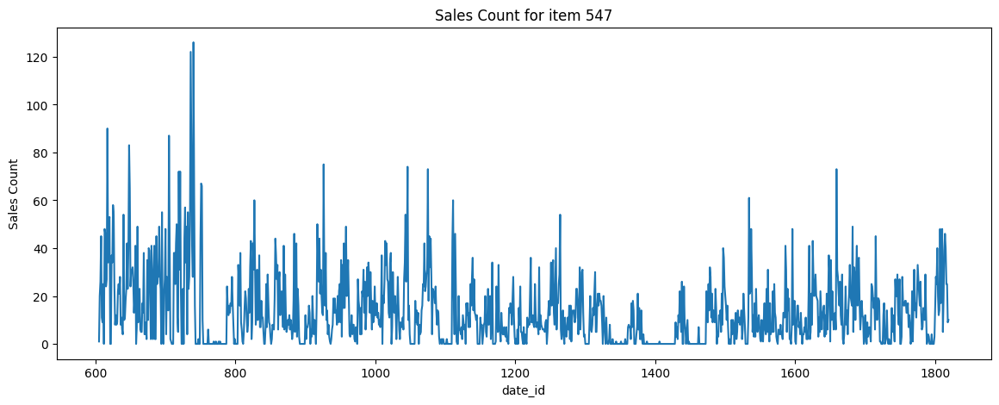

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

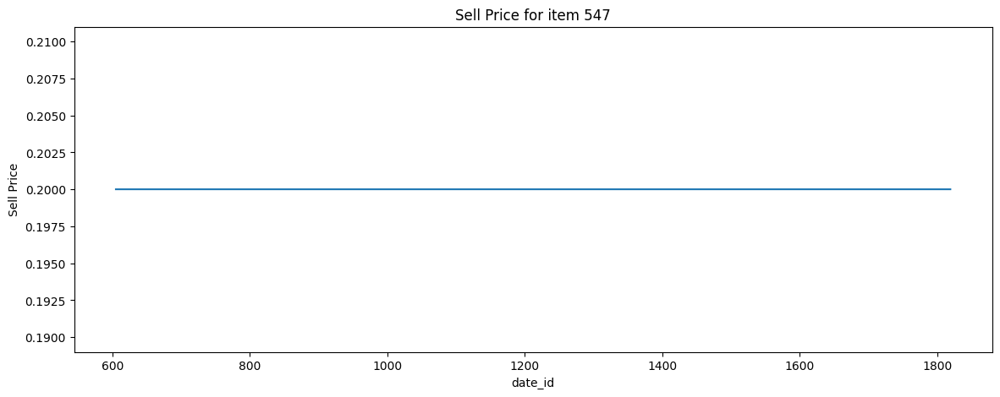

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

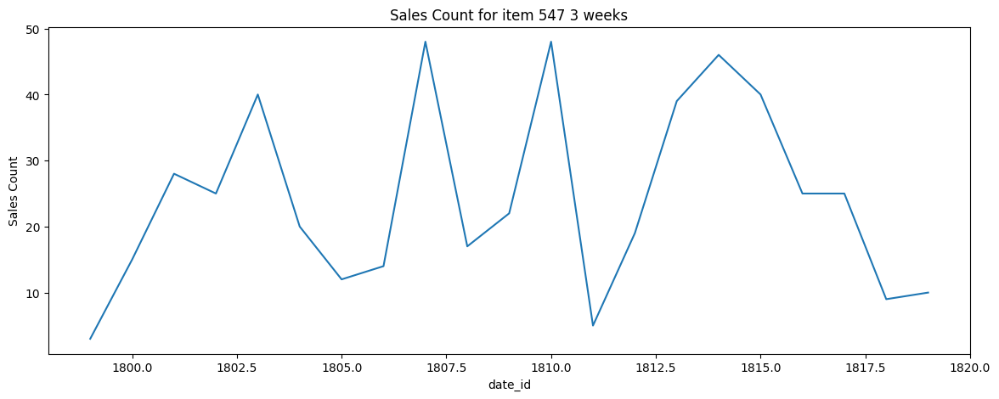

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

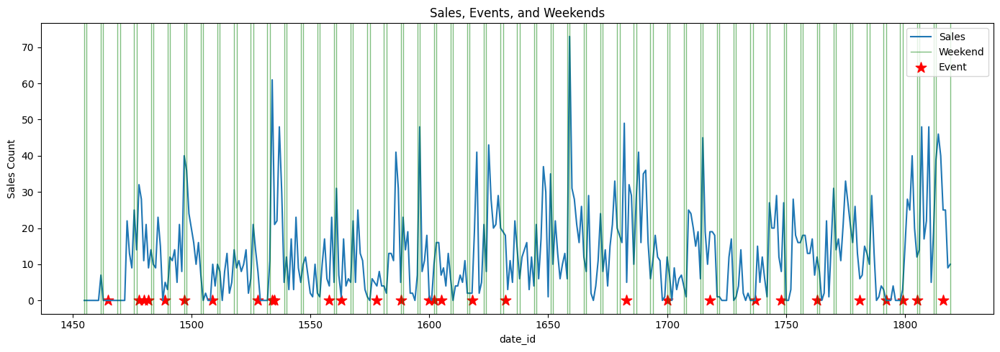

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

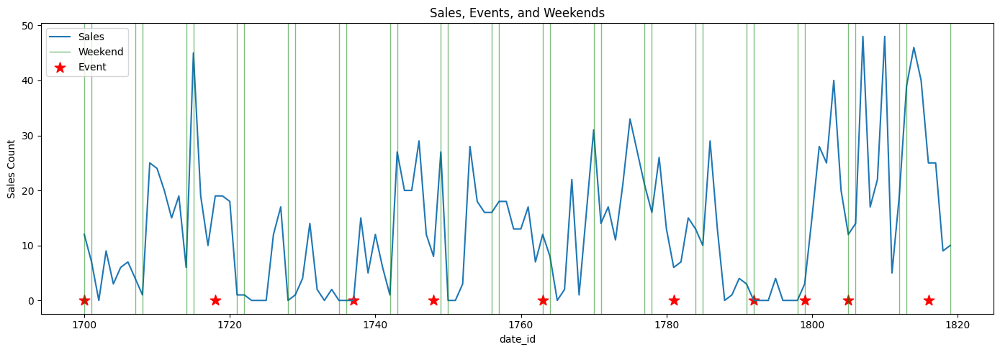

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд слабо восходящий.  
Сезонности не наблюдается.  
Корреляции с выходными/праздниками не наблюдается.

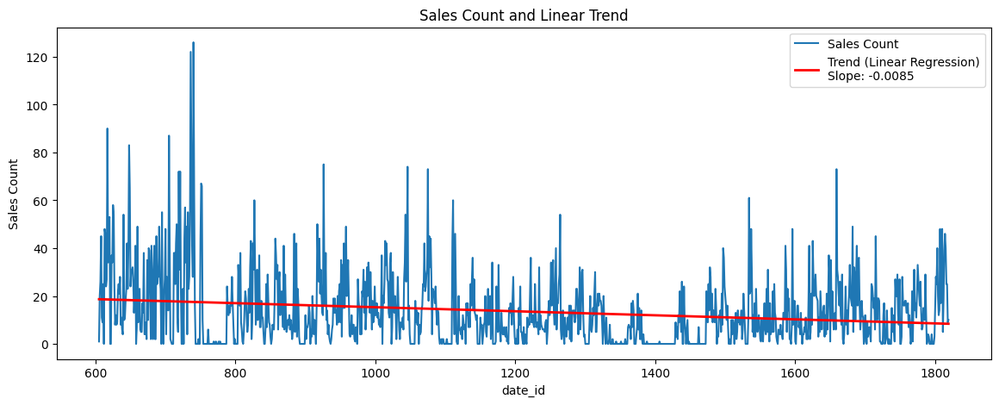

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 4.084030461366289e-19})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)
item_data.loc[:, "target_st"] = item_data.target_st - item_data.target_st.shift(1)

/tmp/ipykernel_8121/3748228115.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)


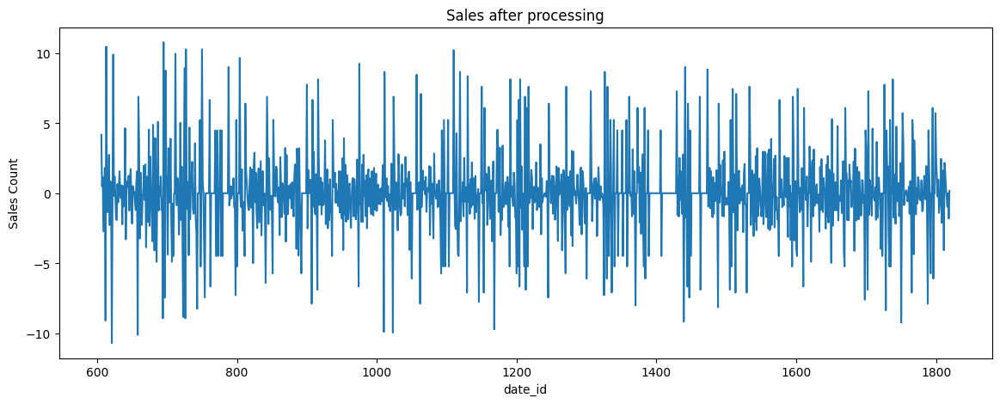

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 4.41920690335369e-29})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

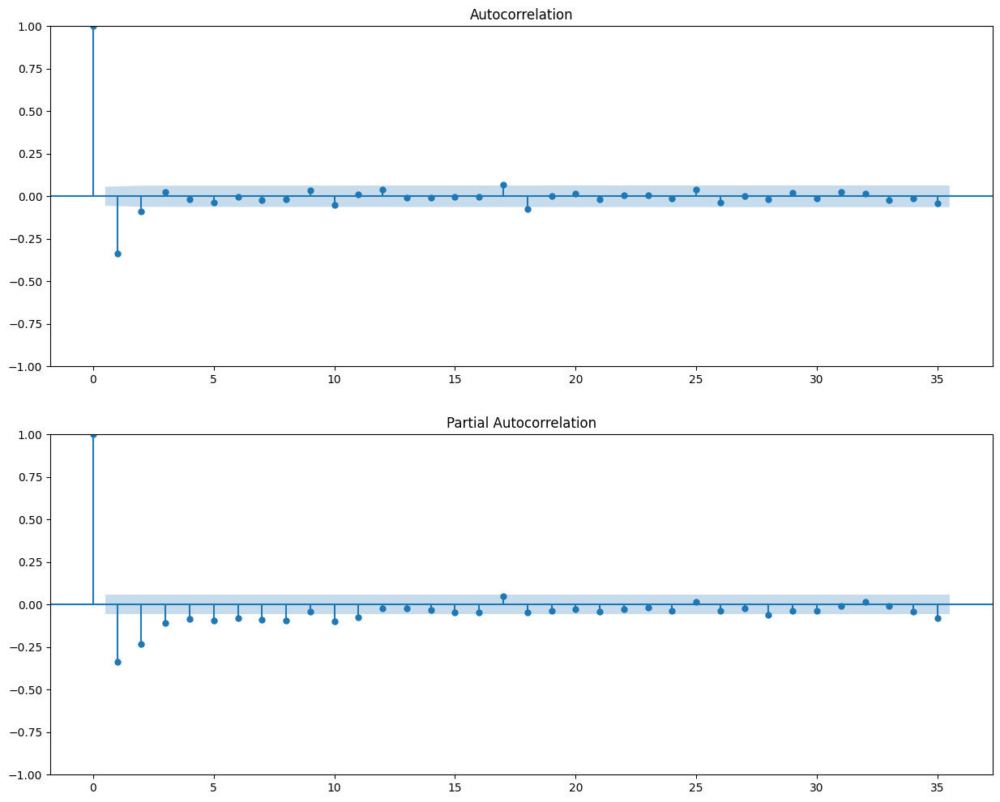

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 17, 18]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 10, 11, 28, 35]


### Item 555

In [ ]:
item_id = "555"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
16975,555,605,3,NaN,NaN,0,1.58,24,9,2012,32
16976,555,606,4,NaN,NaN,0,1.58,25,9,2012,26
16977,555,607,5,NaN,NaN,0,1.58,26,9,2012,23
16978,555,608,6,NaN,NaN,0,1.58,27,9,2012,29
16979,555,609,7,NaN,NaN,0,1.58,28,9,2012,40


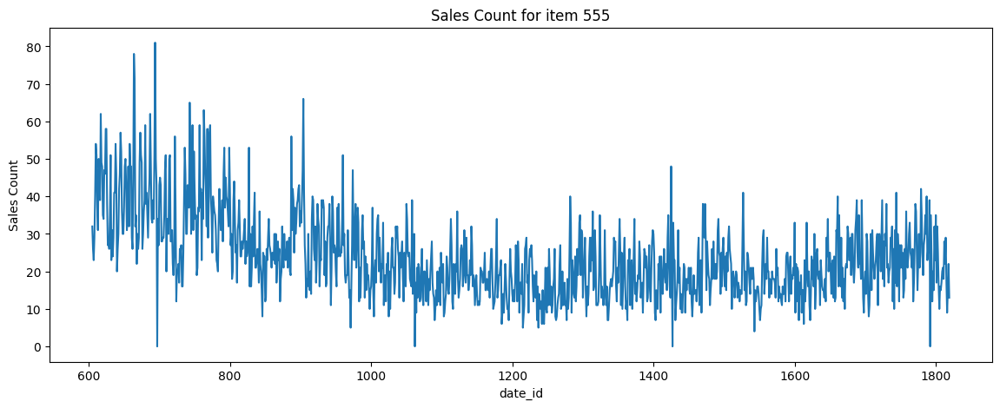

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

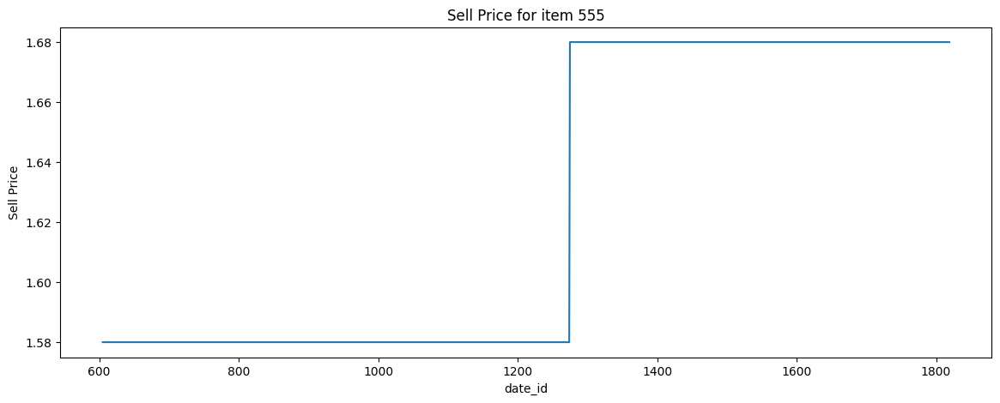

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

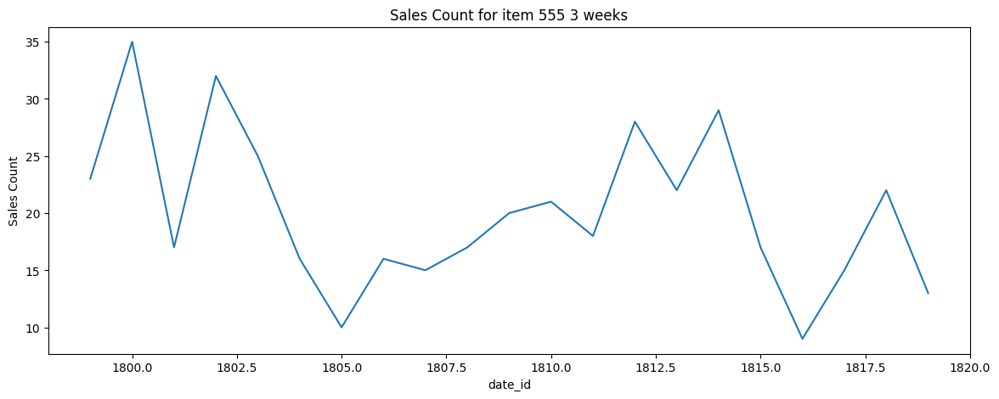

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

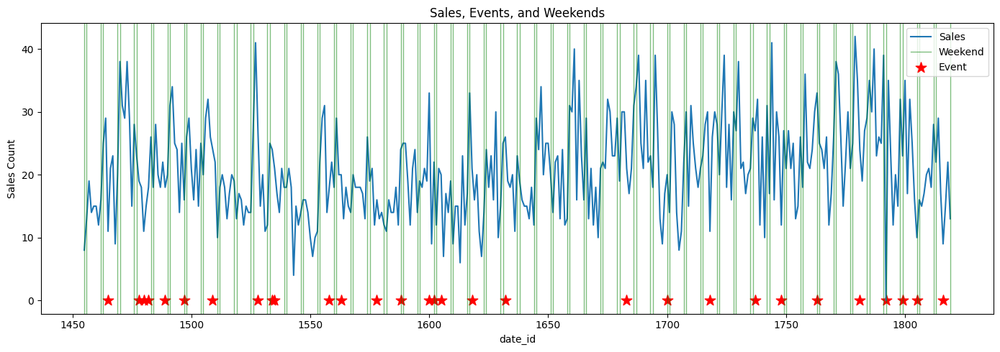

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

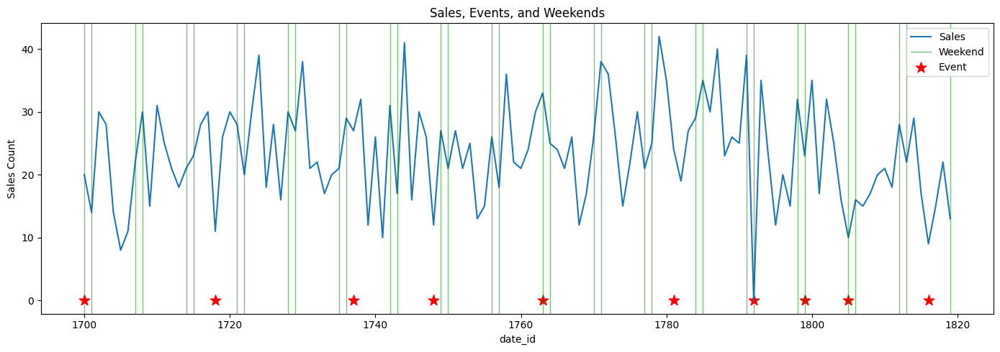

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд/сезонность не наблюдаются.

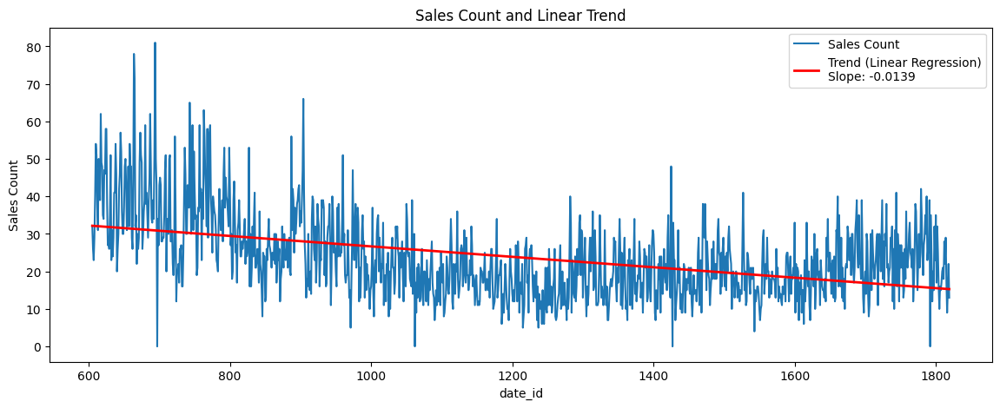

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.01972647551451027})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Преобразование Бокса-Кокса для стабилизации дисперсии
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)
item_data.loc[:, "target_st"] = item_data.target_st - item_data.target_st.shift(1)

/tmp/ipykernel_8121/3748228115.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = MAIN_CLASS.box_cox_transform(item_data.target)


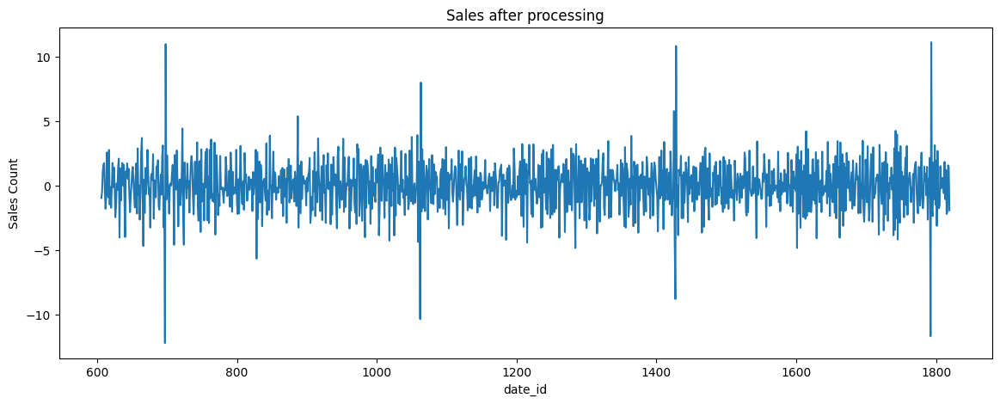

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 3.554409390666218e-20})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

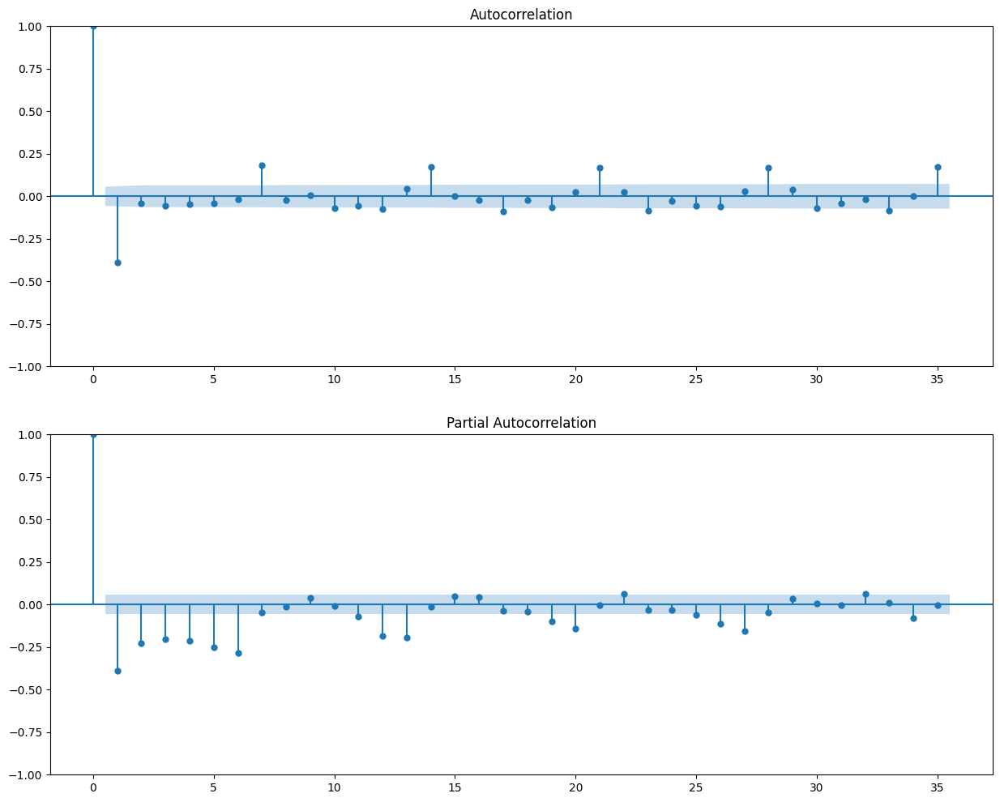

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 7, 10, 12, 14, 17, 21, 23, 28, 33, 35]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 11, 12, 13, 19, 20, 22, 25, 26, 27, 32, 34]


### Item 584

In [ ]:
item_id = "584"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
18794,584,605,3,NaN,NaN,0,1.0,24,9,2012,0
18795,584,606,4,NaN,NaN,0,1.0,25,9,2012,5
18796,584,607,5,NaN,NaN,0,1.0,26,9,2012,1
18797,584,608,6,NaN,NaN,0,1.0,27,9,2012,2
18798,584,609,7,NaN,NaN,0,1.0,28,9,2012,4


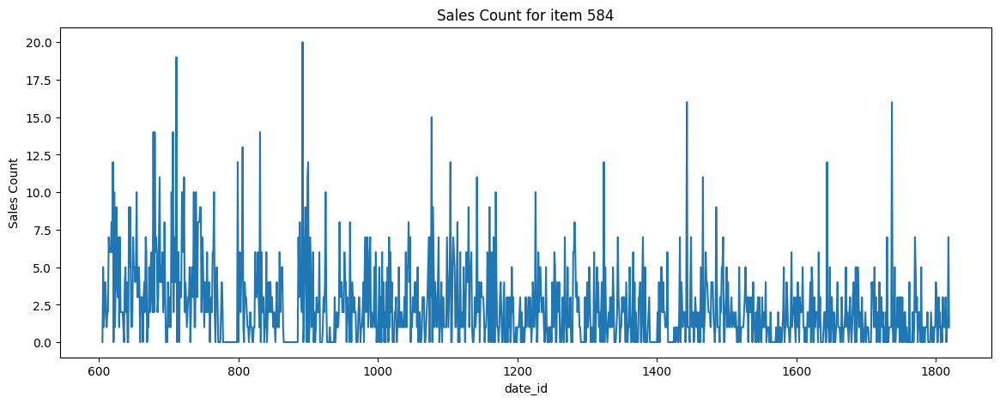

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

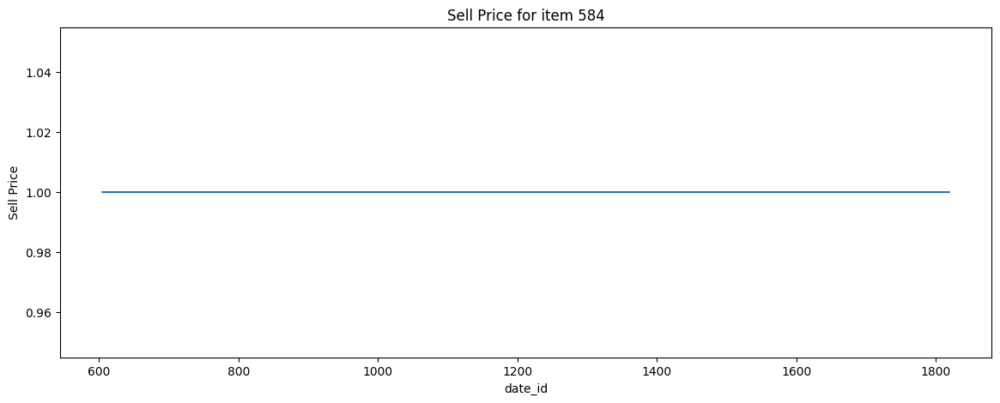

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

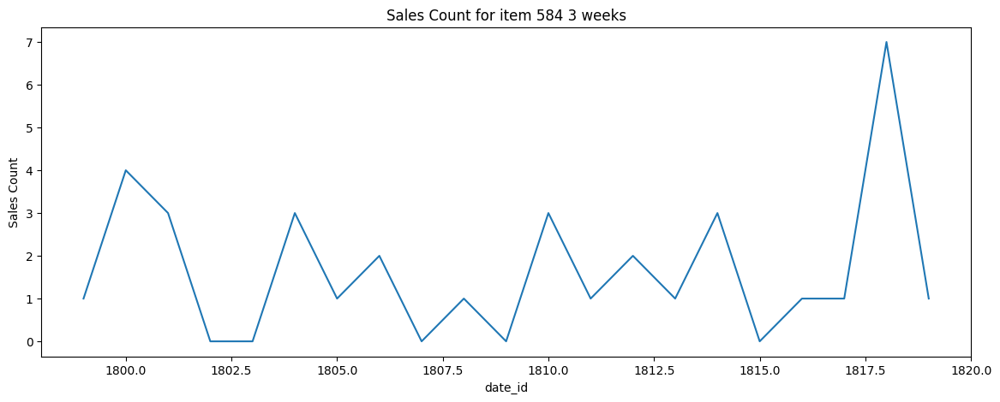

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

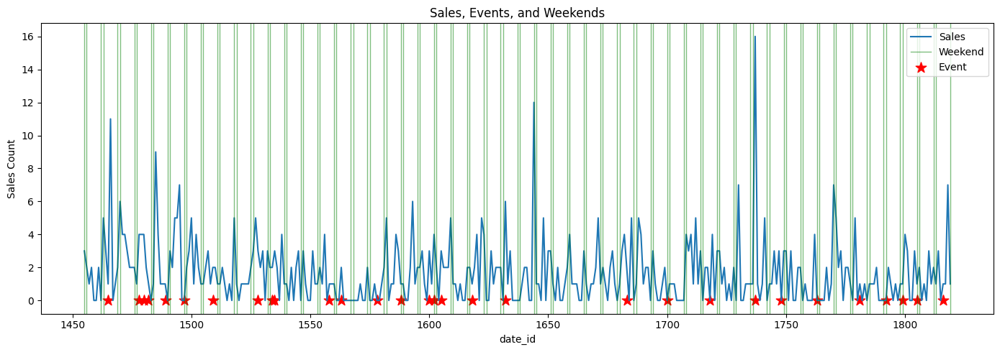

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

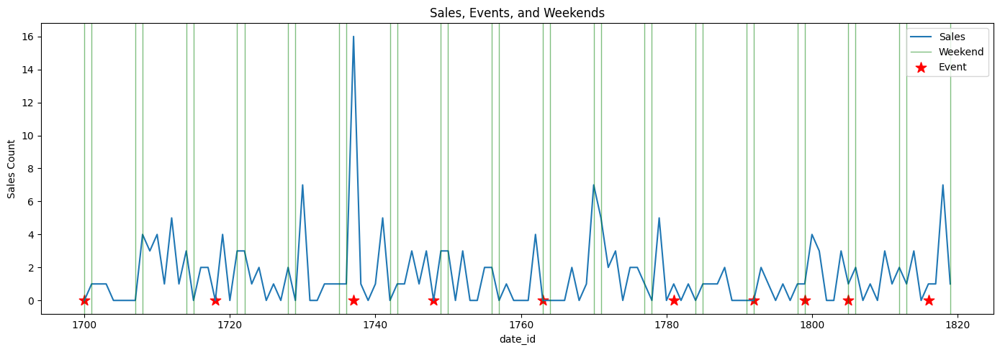

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Слабый нисходящий тренд.  
Сезонность не наблюдаются.

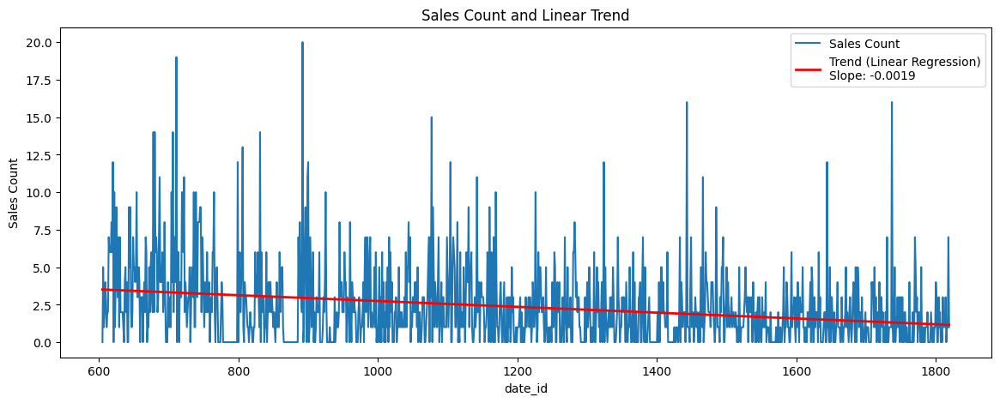

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 2.384976126632385e-13})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)

/tmp/ipykernel_8121/705090826.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)


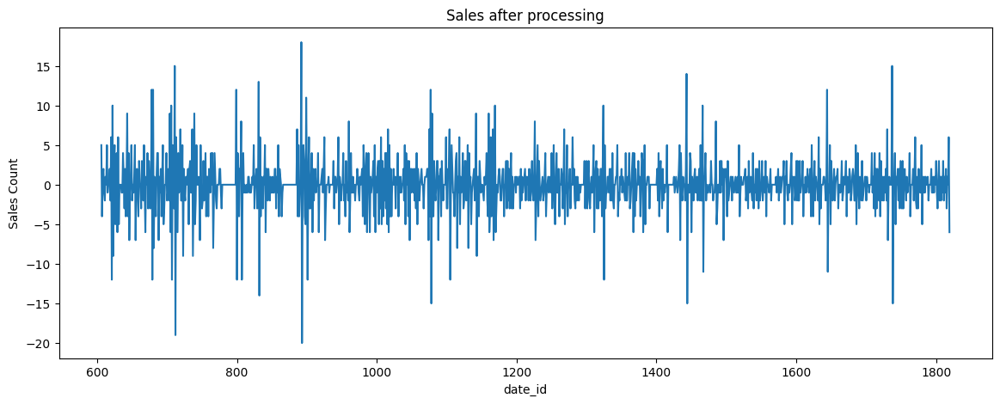

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 3.0478442142701443e-24})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

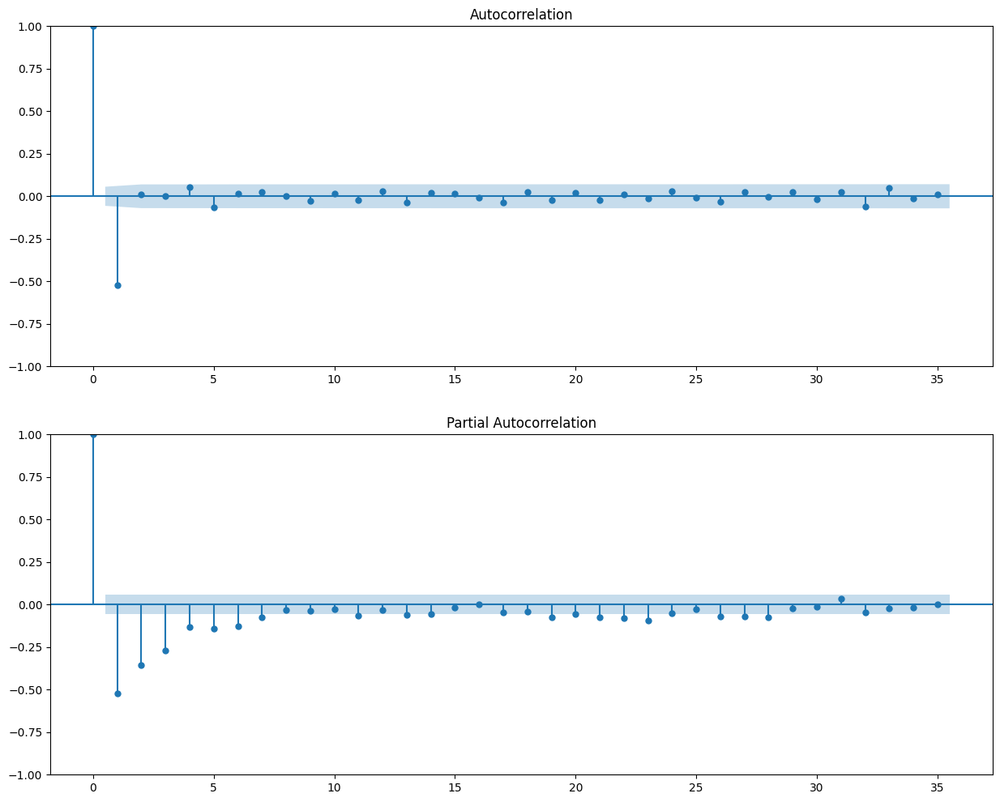

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 11, 13, 19, 21, 22, 23, 26, 27, 28]


### Item 586

In [ ]:
item_id = "586"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
20613,586,605,3,NaN,NaN,0,1.58,24,9,2012,50
20614,586,606,4,NaN,NaN,0,1.58,25,9,2012,44
20615,586,607,5,NaN,NaN,0,1.58,26,9,2012,35
20616,586,608,6,NaN,NaN,0,1.58,27,9,2012,40
20617,586,609,7,NaN,NaN,0,1.58,28,9,2012,63


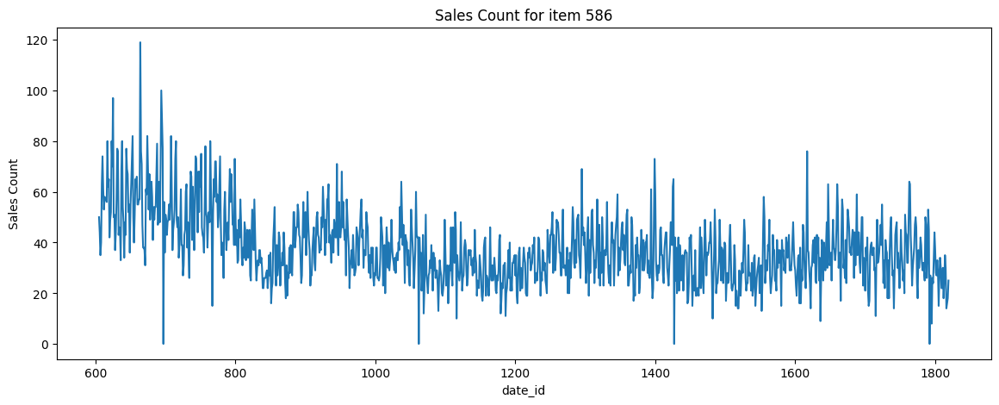

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

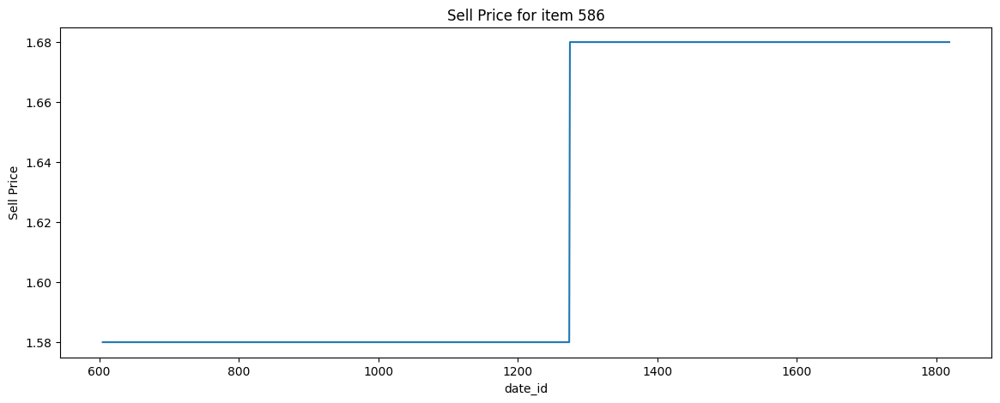

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

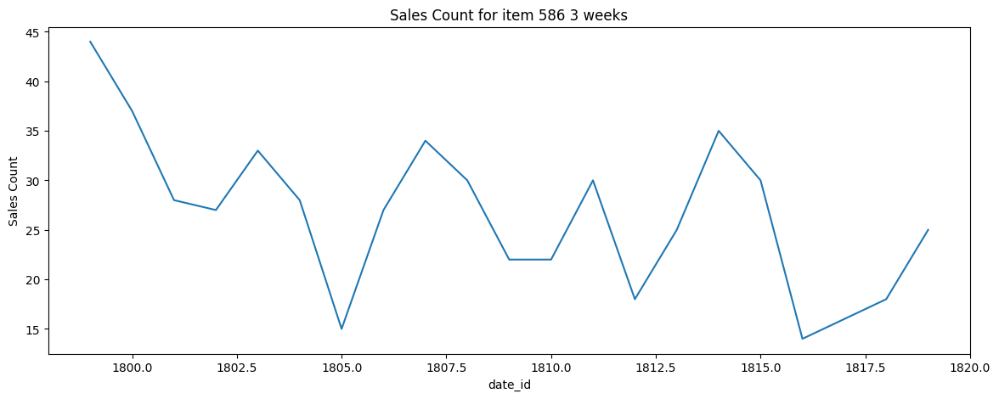

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

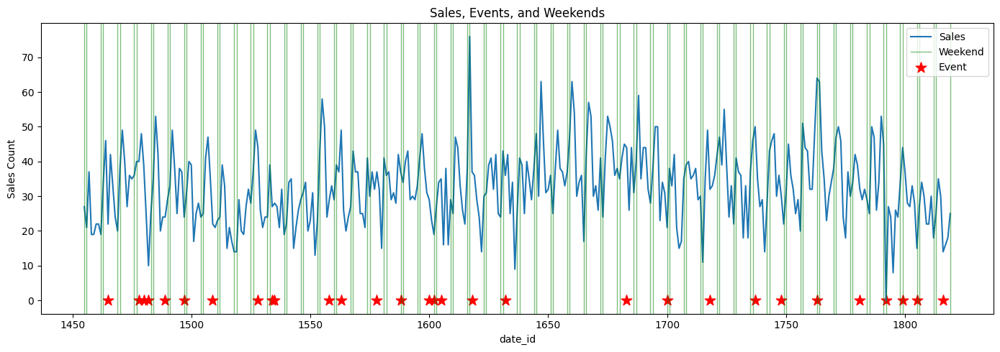

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

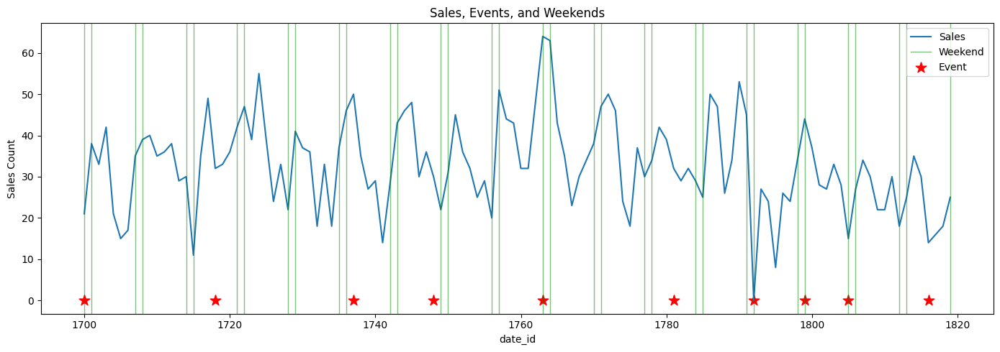

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Слабый нисходящий тренд.  
Сезонность не наблюдаются.

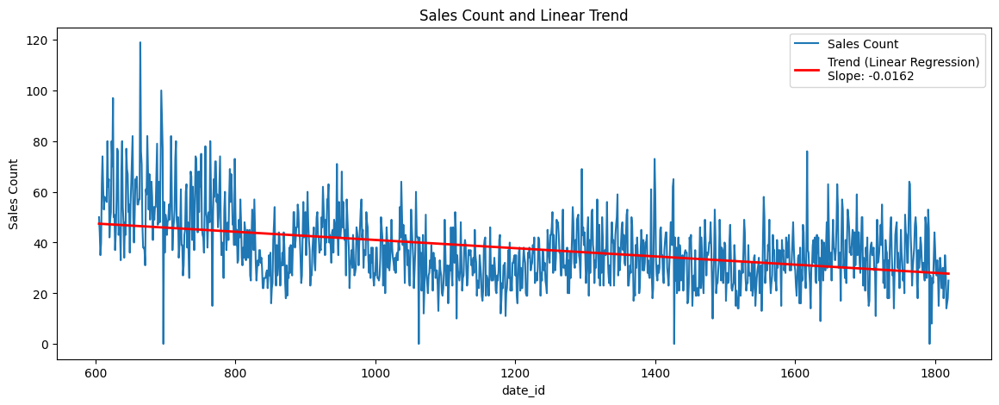

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.033316531886549004})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)

/tmp/ipykernel_8121/705090826.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)


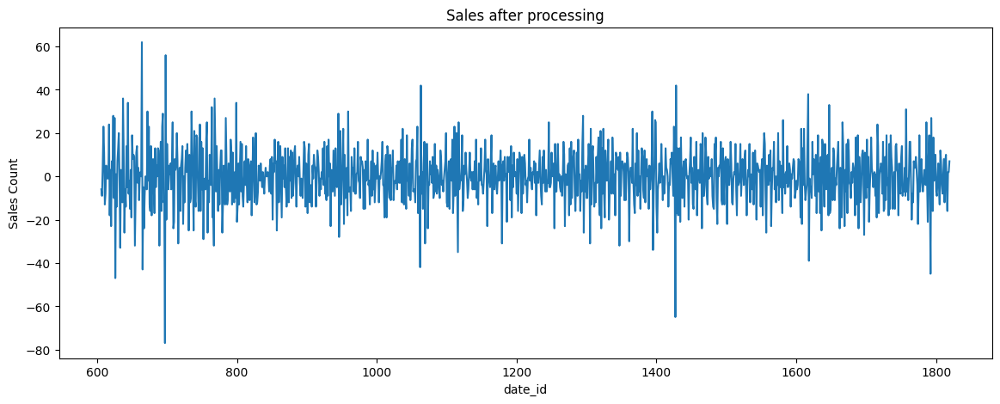

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 1.8835960463379644e-20})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

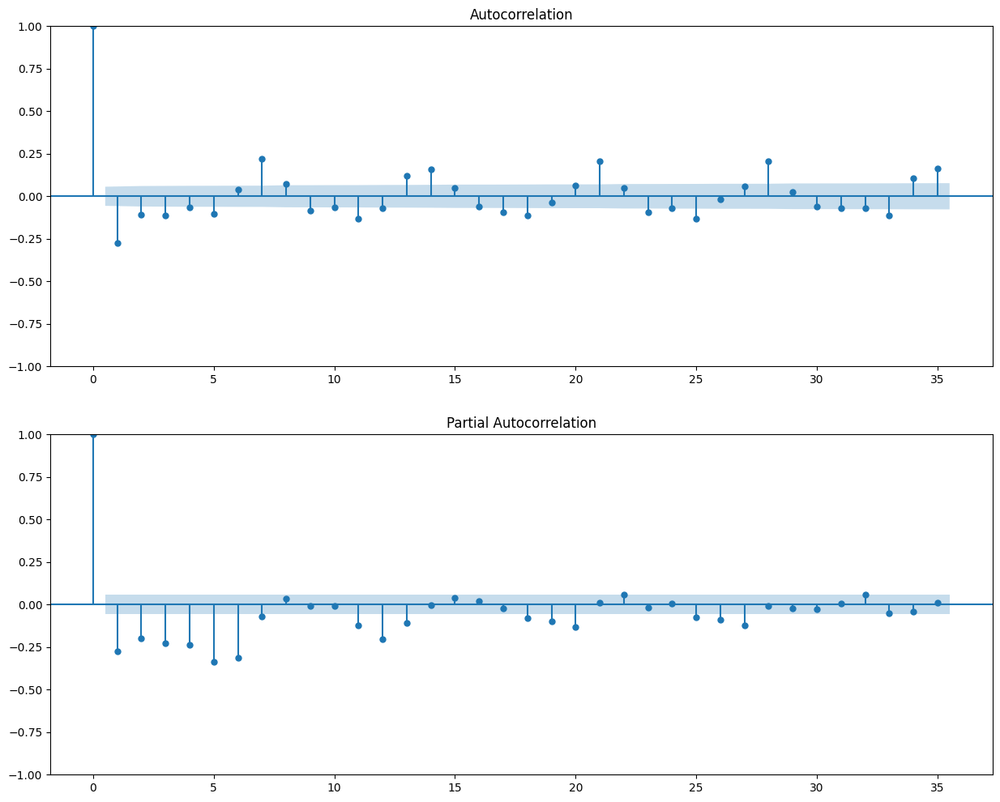

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 4, 5, 7, 8, 9, 10, 11, 12, 13, 14, 17, 18, 21, 23, 25, 28, 33, 34, 35]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 11, 12, 13, 18, 19, 20, 25, 26, 27, 32]


### Item 587

In [ ]:
item_id = "587"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
22432,587,605,3,NaN,NaN,0,2.68,24,9,2012,26
22433,587,606,4,NaN,NaN,0,2.68,25,9,2012,21
22434,587,607,5,NaN,NaN,0,2.68,26,9,2012,21
22435,587,608,6,NaN,NaN,0,2.68,27,9,2012,23
22436,587,609,7,NaN,NaN,0,2.68,28,9,2012,18


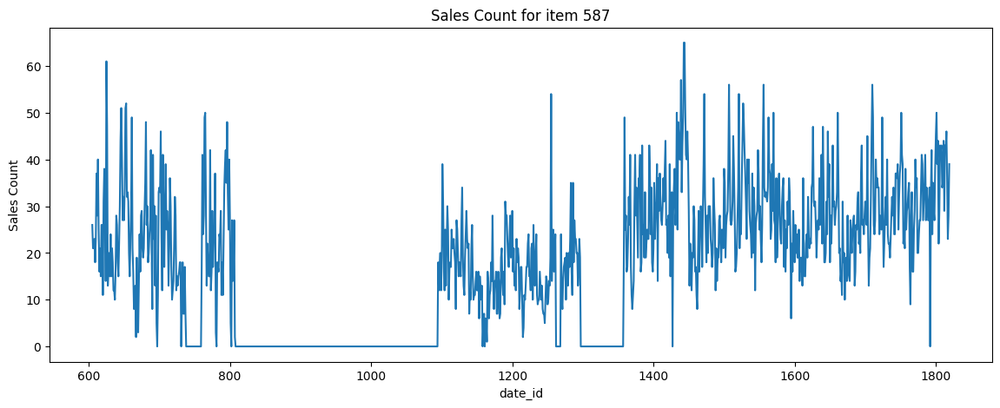

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

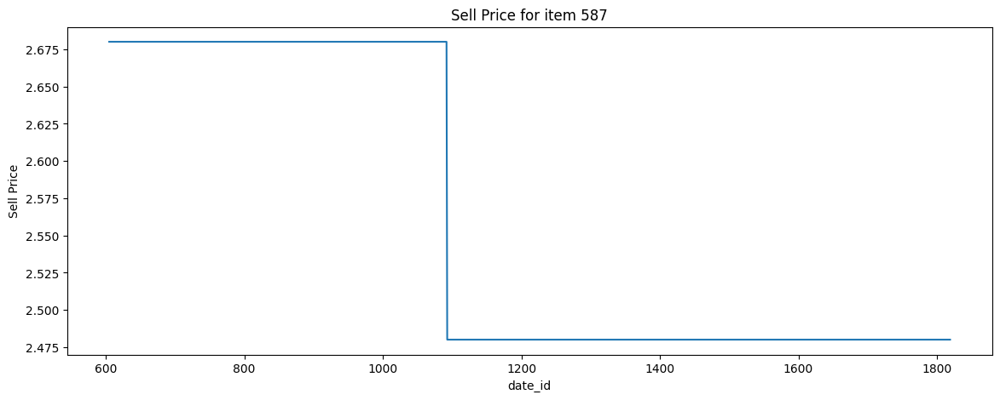

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

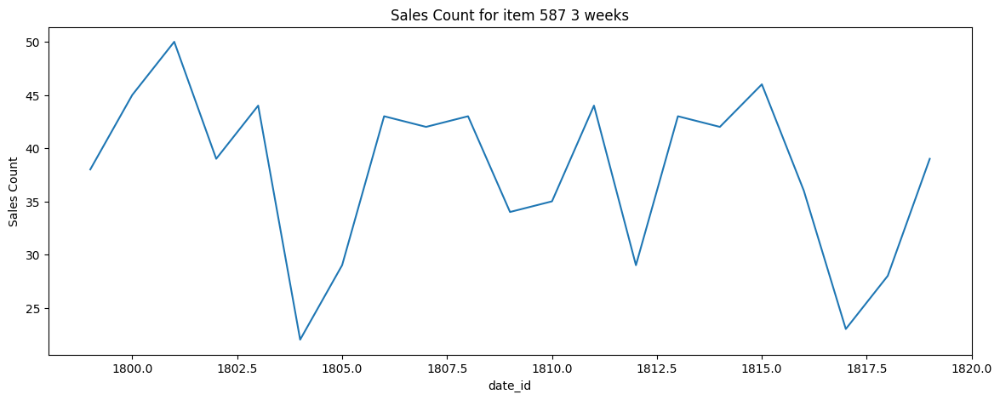

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

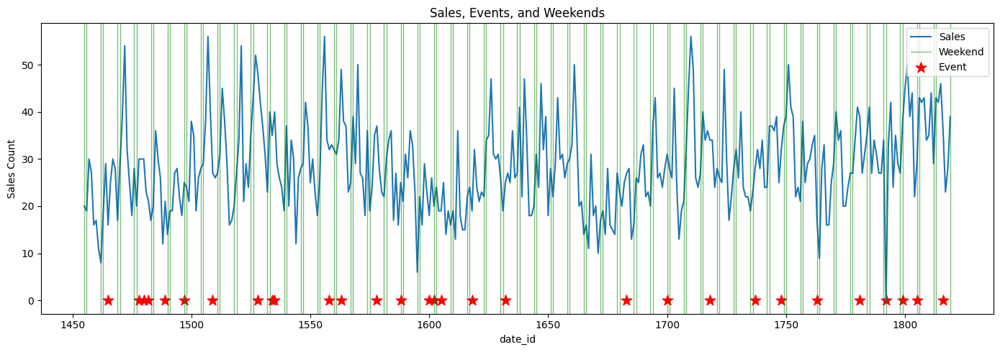

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

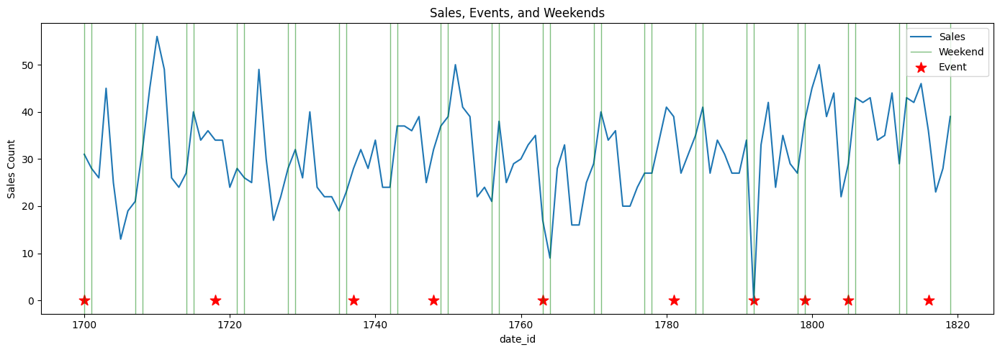

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Слабый восходящий тренд.  
Недельная сезонность (пик = вторник).

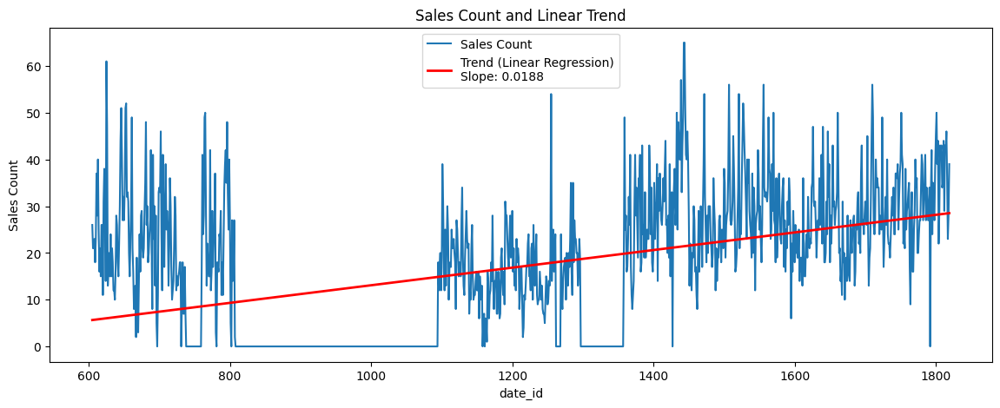

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.1582070616381983})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF принимаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка
* Дифференцирование "вычитанием" 7-го порядка

In [ ]:
item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)
item_data.loc[:, "target_st"] = item_data.target_st - item_data.target_st.shift(7)

/tmp/ipykernel_8121/2823845301.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)


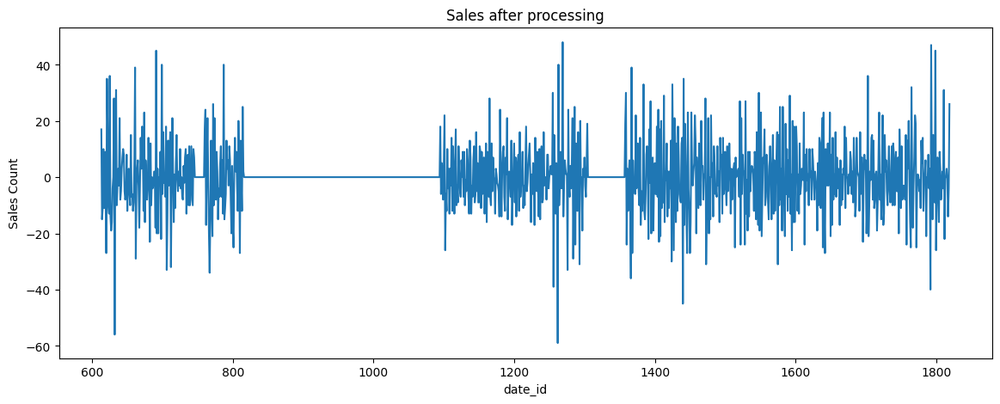

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 7.936250350333143e-25})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

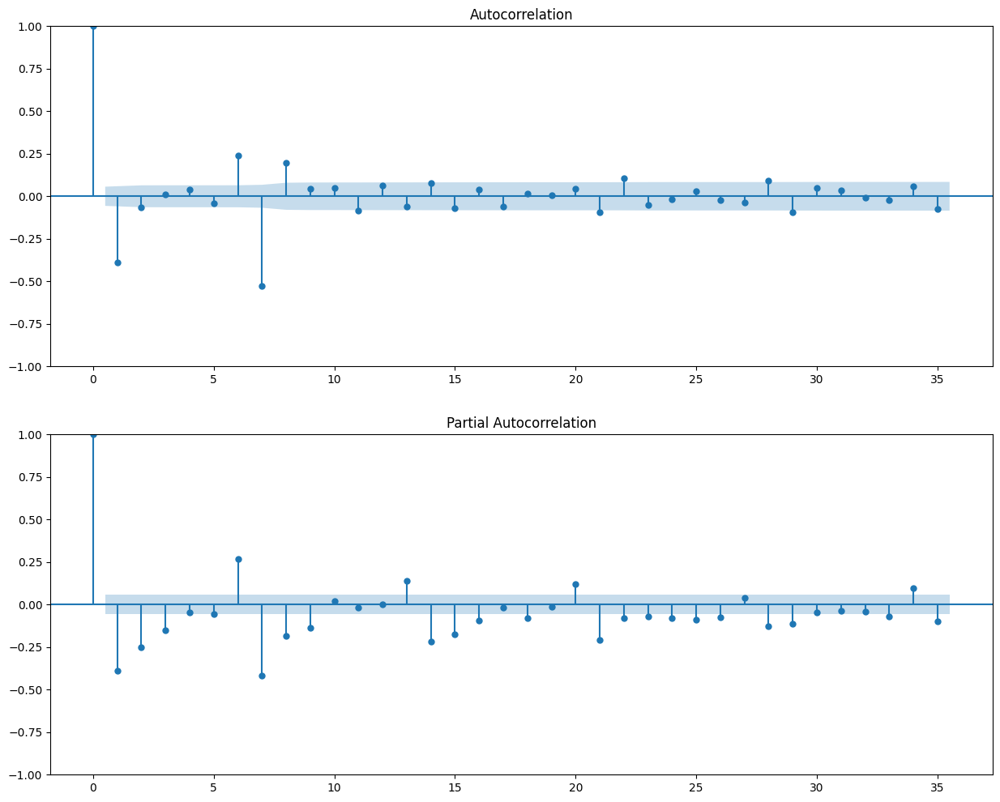

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 6, 7, 8, 11, 21, 22, 28, 29]
Significant PACF lags: [0, 1, 2, 3, 5, 6, 7, 8, 9, 13, 14, 15, 16, 18, 20, 21, 22, 23, 24, 25, 26, 28, 29, 33, 34, 35]


### Item 714

In [ ]:
item_id = "714"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
24251,714,605,3,NaN,NaN,0,1.48,24,9,2012,18
24252,714,606,4,NaN,NaN,0,1.48,25,9,2012,31
24253,714,607,5,NaN,NaN,0,1.48,26,9,2012,20
24254,714,608,6,NaN,NaN,0,1.48,27,9,2012,22
24255,714,609,7,NaN,NaN,0,1.48,28,9,2012,31


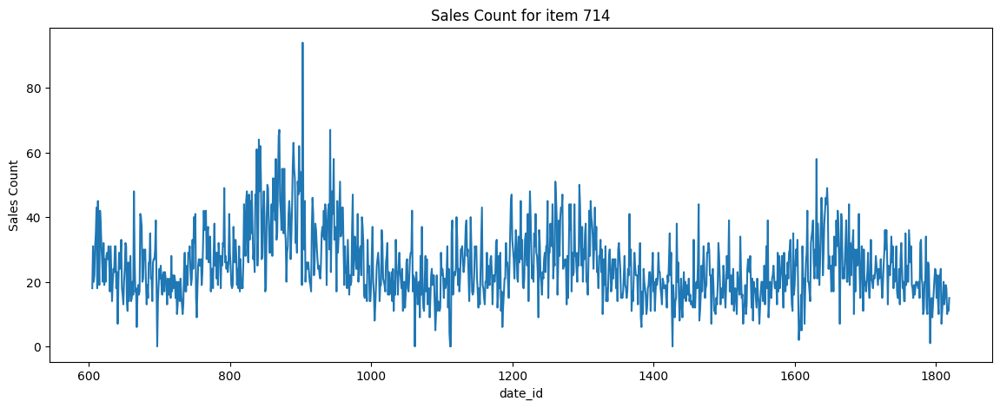

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

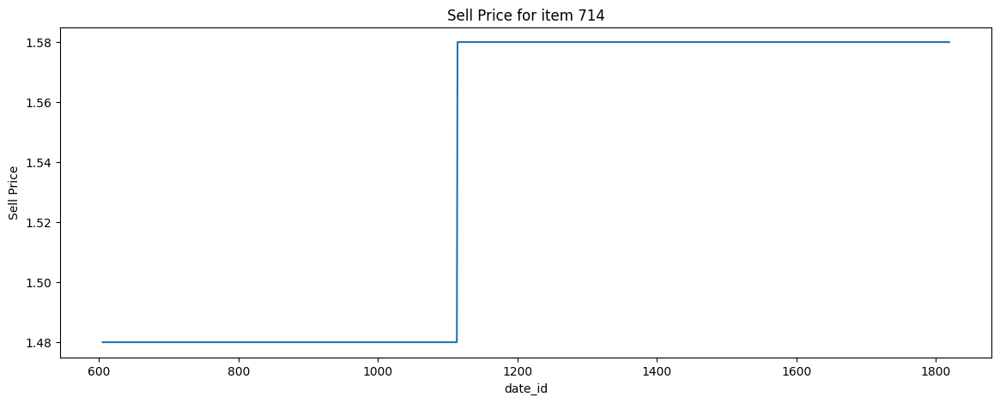

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

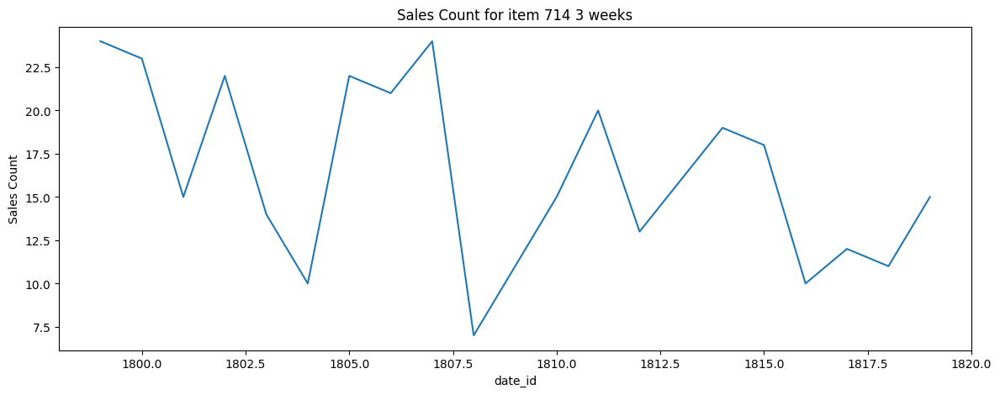

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-21:], item_data.target[-21:])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

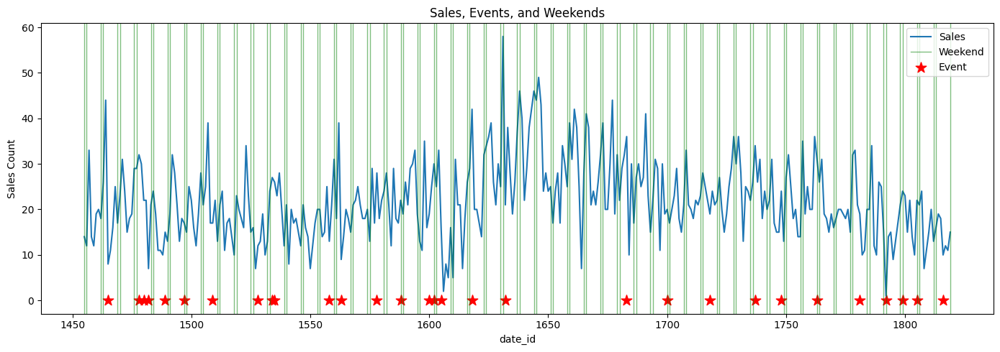

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

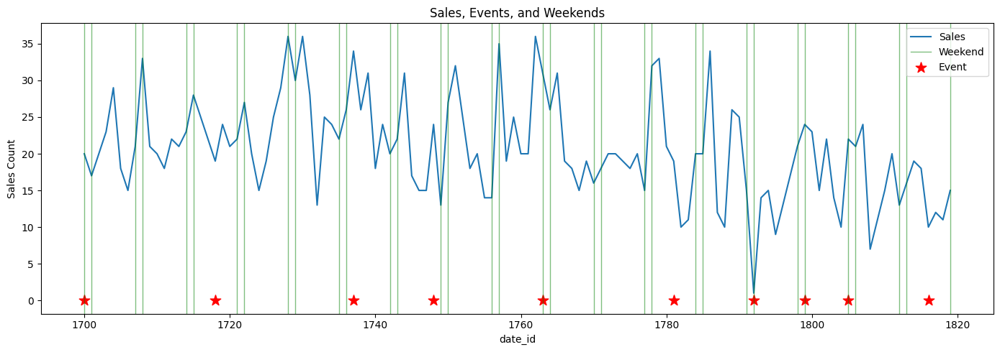

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренд не наблюдается.  
Недельный цикл.  

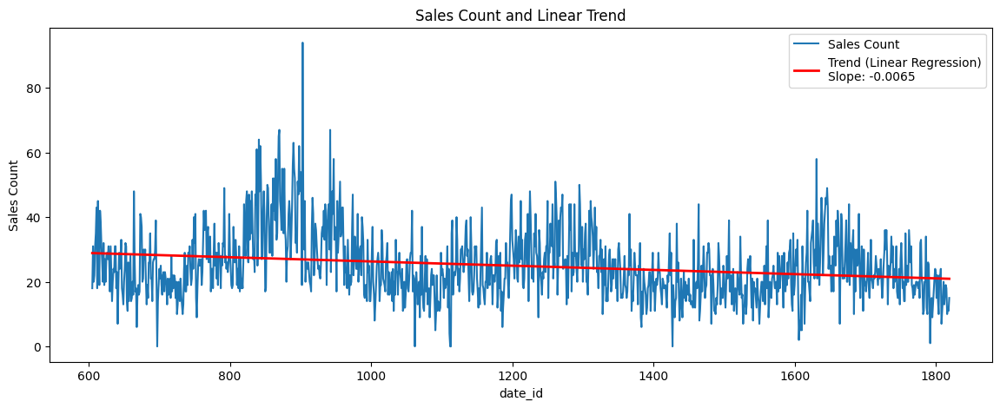

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(True, {'KPSS': 0.01, 'ADF': 0.04412604420677906})

По критерию KPSS мы отвергаем гипотезу "ряд стационарен", а по критерию ADF наоборот отвергаем гипотезу "ряд нестационарен".  
Для того, чтобы сделать ряд стационарным применим следующие преобразования:
* Дифференцирование "вычитанием" 1-го порядка

In [ ]:
item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)

/tmp/ipykernel_8121/705090826.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  item_data.loc[:, "target_st"] = item_data.target - item_data.target.shift(1)


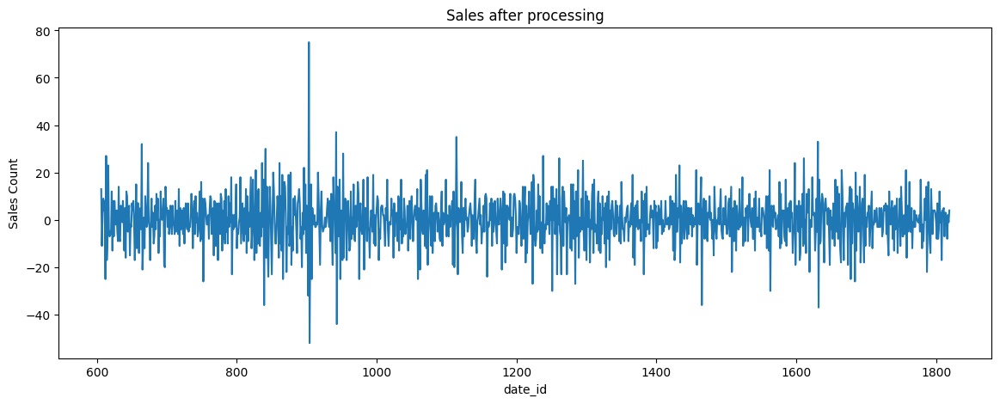

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target_st)
plt.title(f"Sales after processing")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

In [ ]:
utils.test_trend(item_data.target_st.dropna())

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 3.7406130262609715e-22})

Ряд стал стационарным.  
Построим графики ACF и PACF для этого стационарного ряда.

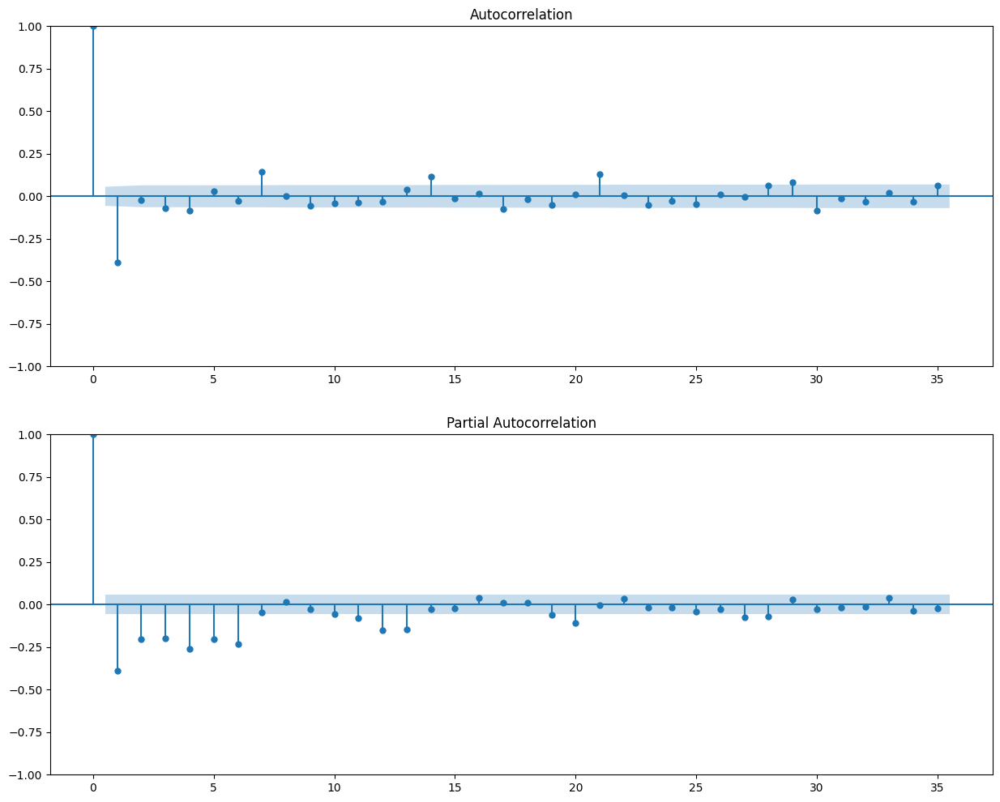

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target_st.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target_st.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target_st.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target_st.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 3, 4, 7, 14, 17, 21, 29, 30]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 11, 12, 13, 19, 20, 27, 28]


### Item 727

In [ ]:
item_id = "727"
item_data = data[data.item_id == item_id]
item_data.head()

,item_id,date_id,wday,event_type_1,event_type_2,cashback,sell_price,day,month,year,target
26070,727,605,3,NaN,NaN,0,3.98,24,9,2012,2
26071,727,606,4,NaN,NaN,0,3.98,25,9,2012,5
26072,727,607,5,NaN,NaN,0,3.98,26,9,2012,2
26073,727,608,6,NaN,NaN,0,3.98,27,9,2012,0
26074,727,609,7,NaN,NaN,0,3.98,28,9,2012,5


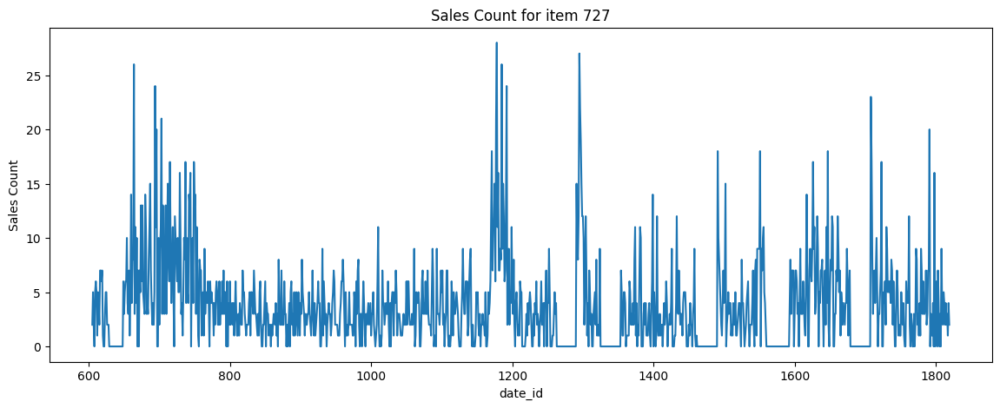

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.target)
plt.title(f"Sales Count for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

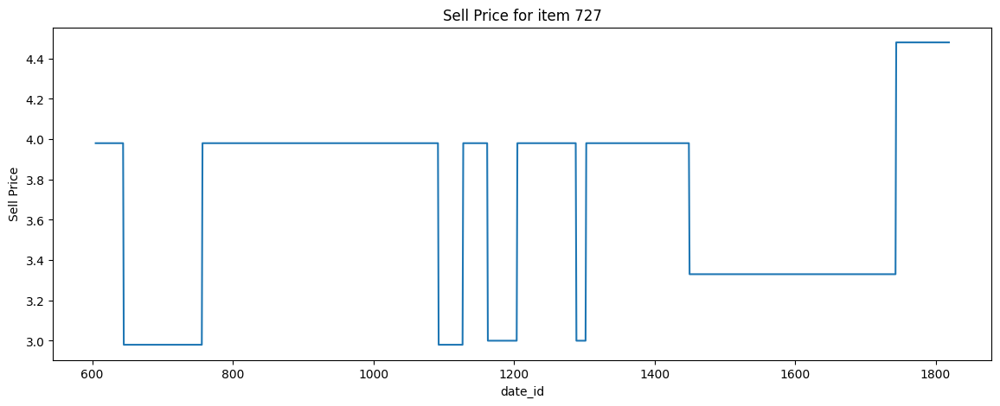

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id, item_data.sell_price)
plt.title(f"Sell Price for item {item_id}")
plt.xlabel("date_id")
plt.ylabel("Sell Price")
plt.show()

Отчетливо наблюдаем повышение продаж при снижении цены.

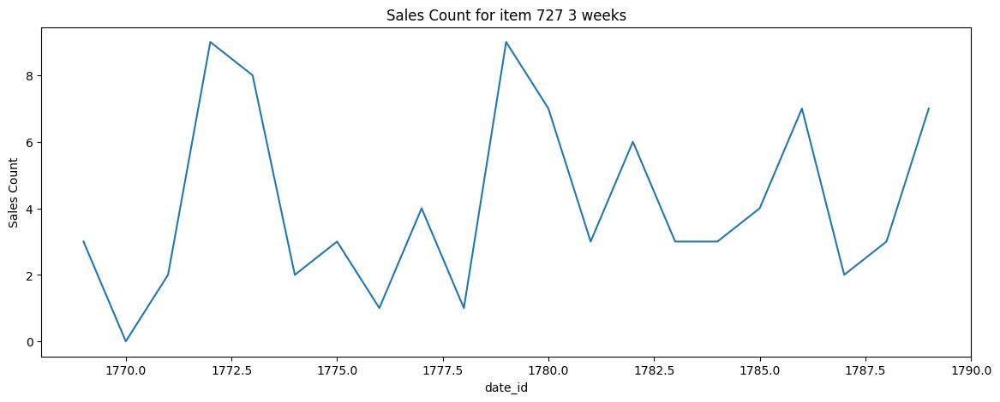

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(item_data.date_id[-51:-30], item_data.target[-51:-30])
plt.title(f"Sales Count for item {item_id} 3 weeks")
plt.xlabel("date_id")
plt.ylabel("Sales Count")
plt.show()

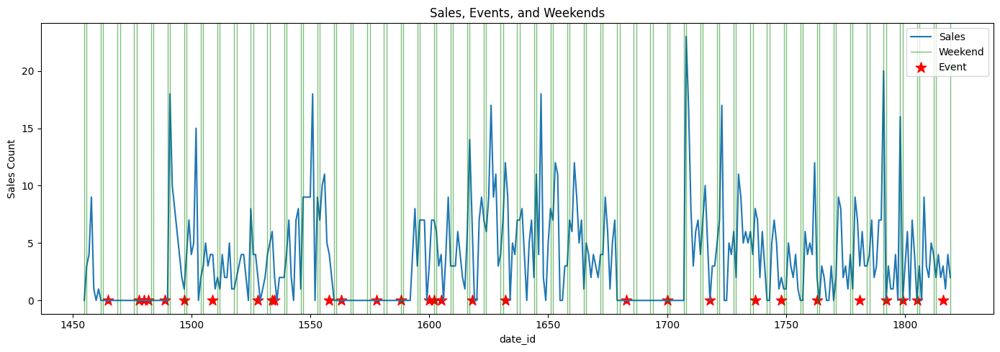

In [ ]:
# Sales for last 365 days (with weekends and events)
utils.plot_item_features(item_data[-365:])

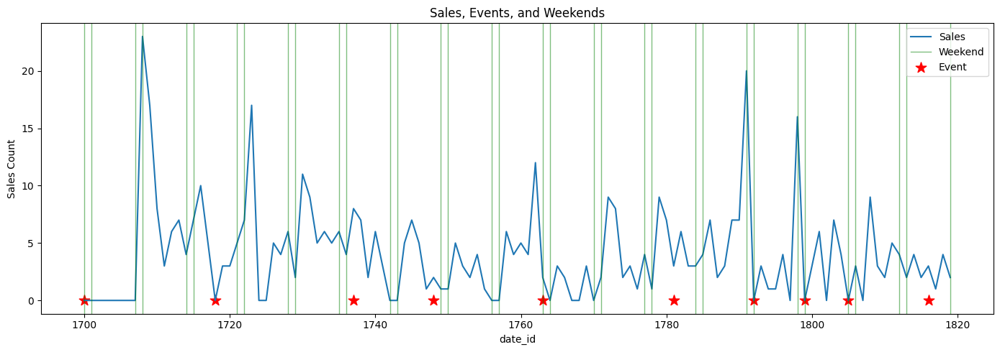

In [ ]:
# Sales for last quater (with weekends and events)
utils.plot_item_features(item_data[-120:])

Тренда/сезонности не наблюдаем.  

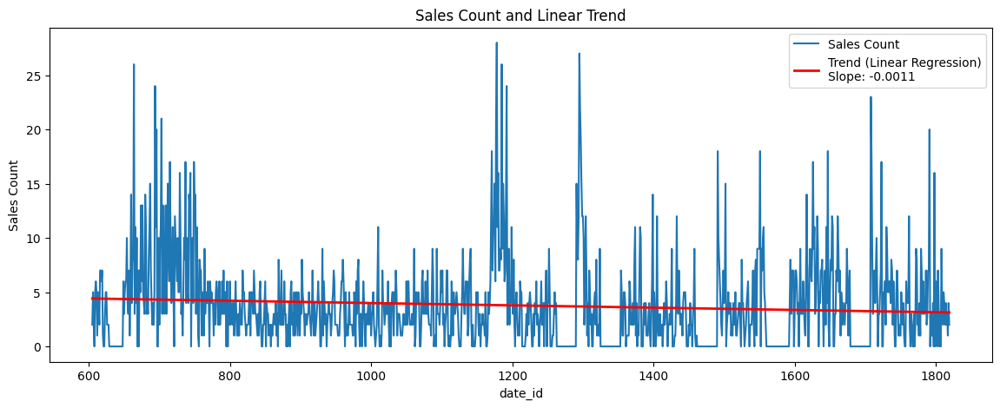

,fit_intercept,True
,copy_X,True
,tol,1e-06
,n_jobs,None
,positive,False


In [ ]:
# Обучим простейшую линейную регрессию из sklearn на продажах и построим как линейный тренд
utils.plot_linear_trend(item_data)

In [ ]:
utils.test_trend(item_data.target)

/home/den/dev/git/time-series-analysis/final-task/solution/utils.py:101: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  kpsstest = kpss(row, regression="c", nlags="auto")


(False, {'KPSS': 0.1, 'ADF': 8.514800402038206e-08})

Ряд стационарен.  
Построим графики ACF и PACF для этого стационарного ряда.

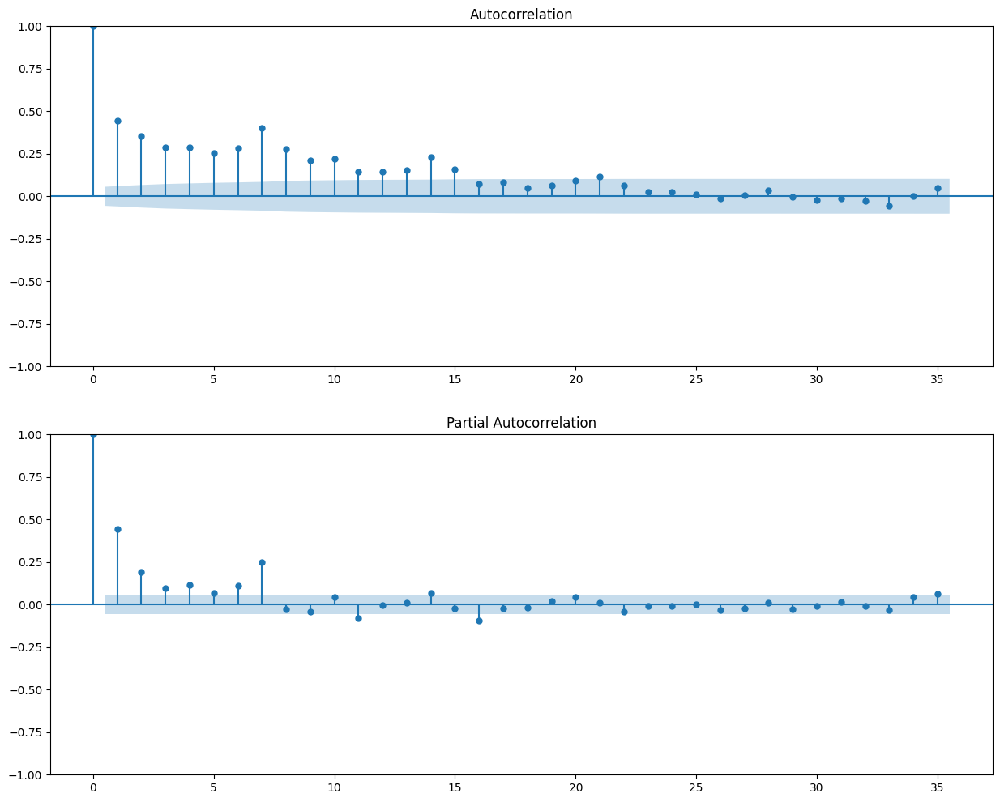

In [ ]:
fig, ax = plt.subplots(2, 1, figsize=(15, 12))
tsaplots.plot_acf(item_data.target.dropna(), ax=ax[0], lags=35)
tsaplots.plot_pacf(item_data.target.dropna(), ax=ax[1], lags=35)
plt.show()

In [ ]:
# Получим точные значения ACF и PACF с доверительными интервалами
acf_vals, acf_confint = acf(item_data.target.dropna(), nlags=35, alpha=0.05)
pacf_vals, pacf_confint = pacf(item_data.target.dropna(), nlags=35, alpha=0.05, method="ywm")

significant_acf_lags = [lag for lag, (low, high) in enumerate(acf_confint) if low > 0 or high < 0]
significant_pacf_lags = [lag for lag, (low, high) in enumerate(pacf_confint) if low > 0 or high < 0]

print("Significant ACF lags:", significant_acf_lags)
print("Significant PACF lags:", significant_pacf_lags)

Significant ACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 21]
Significant PACF lags: [0, 1, 2, 3, 4, 5, 6, 7, 11, 14, 16, 35]
